<a href="https://colab.research.google.com/github/milalangone/asd-diagnosis/blob/main/PSB2023Q1_FINAL_Langone_Simoncelli_Stirparo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# FINAL

Grupo 2:
*   Mila Langone - 61273
*   Ludmila Stirparo - 60055
*   Lucía Simoncelli - 61429

#Objetivo
El objetivo del trabajo final consiste en resolver una problemática del área de las señales biomédicas mediante la elaboración de un algoritmo de Machine Learning y el uso de las herramientas de procesamiento de señales estudiadas durante el cuatrimestre.

# Temática
El tema elegido es la detección del autismo a partir del análisis de las señales de un EEG. Se estudian posibles biomarcadores que pudieran caracterizar e identificar el Trastorno del Espectro Autista a partir de un EEG. Para ello, se evalúan distintas características que, en conjunto, podrían indicar que un paciente tiene o no autismo.




##Materiales y métodos
Se trabaja con la base de datos provista por [(Dickinson, Jeste and Milne, 2022)](https://doi.org/10.1016/j.cortex.2021.09.022). En ella, encontramos 56 [EEGs (link a base de datos)](https://drive.google.com/drive/folders/1B6WPMtwgXMk6FHE6pvimm81ZHwLYCpCQ): 28 de pacientes diagnosticados con el trastorno y 28 sin. Los EEGs fueron medidos con 64 electrodos siguiendo las normativas indicadas por el sistema "BioSemi Active Two System" y el "Standard 1020".

Por otro lado, vamos a trabajar con árboles de decisión, *Support Vector Machine*, *K-nearest neighbor* y *Random Forest* que son algoritmos de Machine Learning (ML) de tipo supervisado. Elegimos estas técnicas dado que contamos con los datos etiquetados (EEGs de pacientes con y sin autismo) y con ellos es posible entrenar al algoritmo para que clasifiquen los EEGs.

## Estado del arte
El Trastorno del Espectro Autista es una discapacidad del desarrollo caracterizada por alteraciones en la interacción social y la comunicación, así como por patrones de comportamiento restringidos, repetitivos y estereotipados.

Actualmente, existen instructivos precisos para diagnosticar autismo, como pueden ser el ADOS (Autism Diagnostic Observation Schedule) y el ADI-R (Autism Diagnostic Interview-Revised). Sin embargo, si bien estas técnicas de evaluación buscan ser objetivas y precisas, presentan muchas limitaciones dado que se trata de técnicas que se basan en la observación del comportamiento del paciente y en entrevistas que les realizan profesionales de la salud.

Teniendo en cuenta estas limitaciones, hoy en día se estan llevando a cabo diversas investigaciones con el objetivo de encontrar nuevas formas para diagnosticar el trastorno. En algunas de estas investigaciones, se estudian las señales de un EEG para intentar encontrar patrones o características que permitan identificar de manera objetiva si alguien presenta o no autismo.

Además, las técnicas utilizadas hoy en día no permiten detectar de manera temprana este trastorno que, a largo plazo, parece estar vinculado con el deterioro acerlerado de las funciones cognitivas [(Dickinson, Jeste and Milne, 2022)](https://doi.org/10.1016/j.cortex.2021.09.022). Por lo tanto, encontrar características que permitan su identificación en un EEG podría ser un primer paso en su tratamiento.

Estas cuestiones son las que le confieren importancia al diagnóstico del trastorno que, además, afecta a cada vez más personas.    

## Problemática

Actualmente, el diagnóstico de autismo se realiza a partir de la observación del comportamiento de los pacientes. En la evaluación clínica se consideran antecedentes genéticos y factores socioambientales en los que se desarrolló el individuo. Esta metodología de evaluación presenta algunas limitaciones.

En primer lugar, al ser téncicas basadas en la observación del comportamiento, es posible que se cometan errores en el análisis, lo cual podría evitarse encontrando alguna característica objetiva que permita asegurar con más confianza que un paciente presenta autismo. Esto es lo que se busca lograr en este trabajo, un algoritmo que, a partir de algunas características, clasifique EEGs en dos grupos: autismo o sin autismo.

Las características que se estudiaran son:

* Variaciones en el pico de frecuencia alfa (PAF)
* Espectro de frecuencias relativo de cada banda (alpha, beta, gamma, delta, theta).
* Proporción relativa de la banda alpha respecto a las otras (U-shape)
* Proporción absoluta entre las bandas alpha y delta

El pico de frecuencia alfa (PAF) es una propiedad del sistema nervioso genéticamente determinada y que se relaciona íntimamente con el funcionamiento cognitivo de cada individuo [(Rathee, Bhatia, Punia and Singh, 2020)](https://doi.org/10.1055/s-0040-1712585). Actualmente, existen estudios como el de [(Dickinson, Jeste and Milne, 2022)](https://doi.org/10.1016/j.cortex.2021.09.022), que buscan vincular la disminución de PAF acelerada con el deterioro cognitivo en pacientes con autismo con respecto a aquellos sin autismo.

El espectro de potencias se calcula a partir del área bajo la curva en el espectro de Welch realizado para cada banda. Se miden la potencia relativa, es decir, la actividad en una banda con respecto a las demás, y la absoluta, la actividad en cada banda individualmente. Se estudian variaciones en las potencias entre pacientes con y sin autismo.

A partir del anális de la potencia, se estudia la U-shape de frecuencias anormales que se produce por las variaciones en el PSD. En el estudio de [(Wang, 2013)](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3847481/), se destacan los siguientes resultados:

* Exceso de delta, theta, beta y gamma
* Disminución de alpha

Se denomina U-shape dado que el exceso de delta, theta, beta y gamma corresponde a un exceso de la potencia en los extremos mientras que la disminución de alpha se da en el centro, a partir de lo cual es poisble obtener una "U".

Por último, la relación relativa y absoluta entre alpha y el resto de las bandas está íntimamente relacionada con la U-shape.

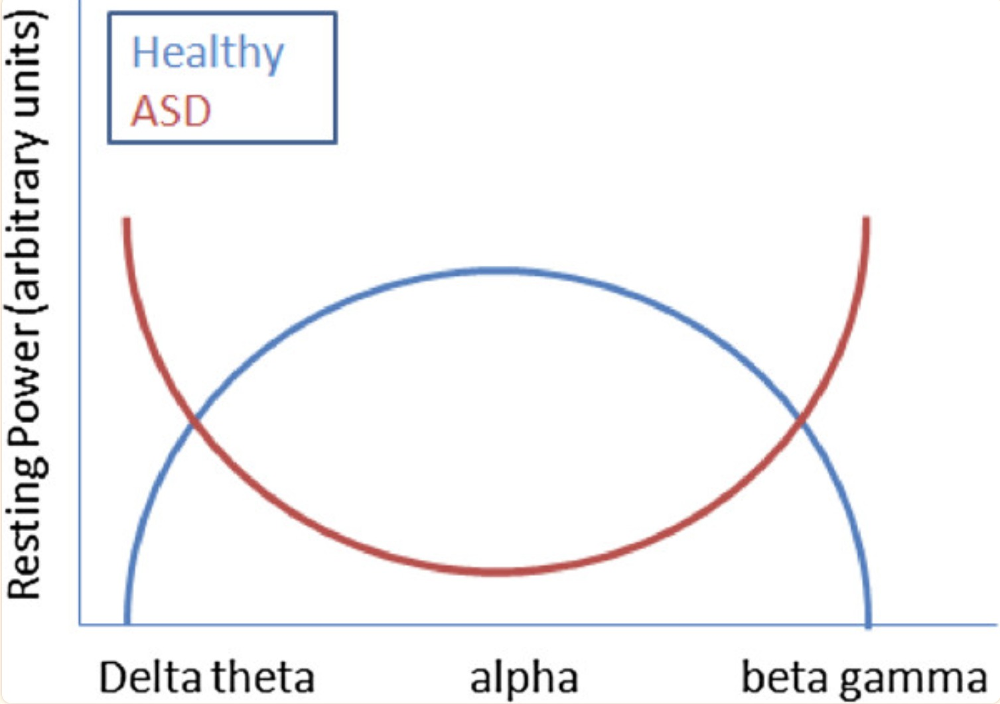

##Diseño
En esta sección, se describe el algortimo ideal para solucionar la problemática, los objetivos que nos servirán para evaluar si el algoritmo resuelve o no la problemática y se lo compara con estrategias similares de otros artículos.

###Comparación con estrategias similares y elaboración de un algoritmo ideal
Encontramos estudios que investigan la posibilidad de que existan biomarkers asociados a deterioros en las funciones cognitivas, no necesariamente relacionadas con el trastorno del espectro autista.

1. [Dickinson, Jeste and Milne (2022)](https://doi.org/10.1016/j.cortex.2021.09.022) y [Rathee, S., Bhatia, D., Punia, V., & Singh, R. (2020)](https://doi.org/10.1055/s-0040-1712585) buscan establecer una relación entre PAF y mayor deterioro cognitivo en pacientes con autismo.

2. [Wang (2013)](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3847481/) detectan que existen variaciones en las potencias absolutas y relativas de las bandas en pacientes con o sin autismo. Con esta información describen la denominado *U-shape*.

3. [Saba-Sadiya, Chantland, Alhanai, Liu, & Ghassemi (2021)](https://doi.org/10.3389/fdgth.2020.608920) describen algunas características que utilizan para comparar distintos EEGs, entre ellas, el ratio alpha/delta.

Basándonos en sus investigaciones, desarrollamos un algoritmo que toma las características mencionadas y las utiliza para clasificar EEGs en dos grupos: pacientes con  o sin el trastorno. Si bien sus trabajos no están directamente vinculados con el diagnóstico del autismo, sus hallazgos nos proporcionaron una buena base para elaborar nuestro propio algoritmo e investigar la posibilidad de detectar el trastorno a partir de estos biomarkers utilizando inteligencia artificial.

A continuación, se esquematiza el algoritmo ideal con el que se solucionaría la problemática planteada. Se identifican los pasos realizados para acondicionar la señal, elegir los canales  y aplicarles ICA (Análisis de Componentes Independientes). Luego, se reliza la extracción de las características a partir del EEG y se las analiza. Finalmente, se entrenan distintos algoritmos de ML supervisado y se evalúa su funcionamiento.

Cabe destacar el uso de ICA,  una técnica que busca descomponer una señal mezclada en sus componentes fuente originales, asumiendo que estas son estadísticamente independientes entre sí. En este caso, aplicamos ICA con el objetivo de identificar artefactos, como el ruido de EOG. De esta manera, al no contar con un canal específico para estos artefactos, es posible su eliminación y la reconstrucción de la señal limpia.

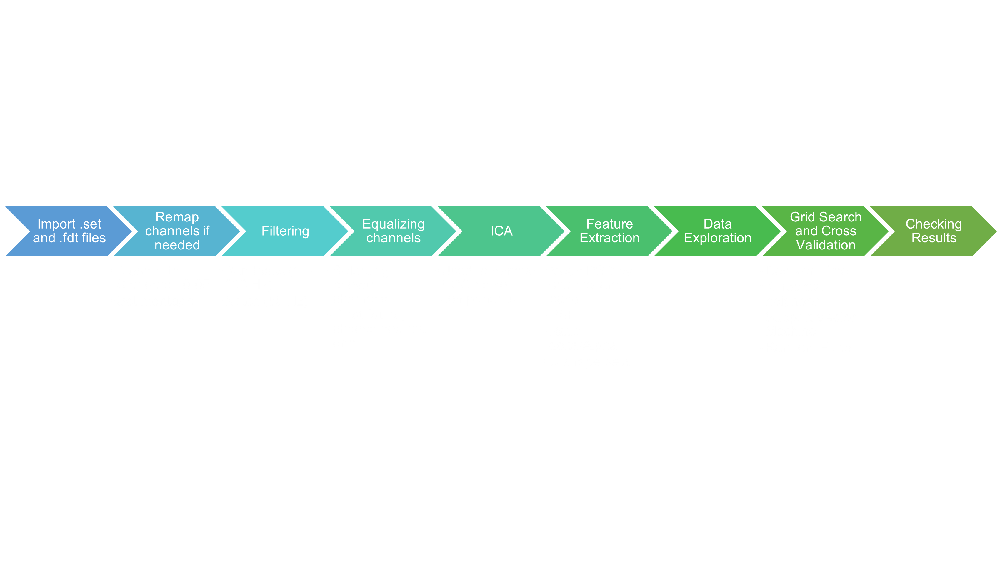

###Objetivos
Presentamos los objetivos de mínima y máxima que nos servirán para evaluar los resultados de nuestro trabajo en función de lo esperado.

* De mínima: encontrar una característica de la señal del EEG que permita identificar si un paciente presenta o no el trastorno, con algun modelo de ML, con una efectividad de más del 60%.

* De máxima: encontrar entre tres y cuatro características de la señal del EEG que permita identificar si un paciente presenta o no el trastorno, con algun modelo de ML, con una efectividad de más del 90%.

# Desarrollo

En esta sección se detallan el procesamiento de la señal realizado y la elaboración de los algoritmos de ML utilizados para resolver la problemática.


## Preliminares y archivos

Importamos las principales librerías a utilizar y montamos Drive.

In [ ]:
!pip install mne;

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 49.3 MB/s eta 0:00:00


In [ ]:
import os
import mne
import pandas as pd
import numpy as np
import scipy.signal
import scipy.io.wavfile as wvf
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

drive.mount('/content/drive')
plt.style.use('dark_background')

Mounted at /content/drive


Cargamos los archivos que se utilizarán a lo largo del trabajo.

In [ ]:
path = '/content/drive/MyDrive/EEG_AUTISM'
raw_data = []

set_files = [os.path.join(path, f) for f in os.listdir(path) if f.endswith('.set')]

for set_file in set_files:
  eeg = mne.io.read_raw_eeglab(set_file, preload = True, verbose = 'error')
  raw_data.append(eeg)

## Acondicionamiento y filtrado de la señal

Definimos la frecuencia de muestreo e inspeciconamos el contenido de la información cargada.

In [ ]:
fs = 512
raw_data[1].info

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, AF7, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C3, C5, TP7, CP5, ...
 chs: 56 EEG
 custom_ref_applied: False
 dig: 59 items (3 Cardinal, 56 EEG)
 highpass: 0.0 Hz
 lowpass: 256.0 Hz
 meas_date: unspecified
 nchan: 56
 projs: []
 sfreq: 512.0 Hz
>

In [ ]:
for i, raw in enumerate(raw_data):
  print(f'{i}. {raw.ch_names}')

0. ['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF4', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'C4', 'C6', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P8', 'P10', 'PO8', 'PO4', 'O2']
1. ['Fp1', 'AF7', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C3', 'C5', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P9', 'PO7', 'PO3', 'O1', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P8', 'P10', 'PO8', 'PO4', 'O2']
2. ['Fp1', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6

Notamos que algunos de los canales efectivamente pertenecen al sistema BioSemi de electrodos, por lo que es necesario establecer una correspondencia con el sistema 10-05 para continuar.

In [ ]:
# Mapping Biosemi a 1005

channel_mapping = { 'A1': 'Fp1', 'A2': 'AFp1', 'A3': 'AF7', 'A4': 'AF3', 'A5': 'AFF5h',
    'A6': 'AFF1h', 'A7': 'F9', 'A8': 'F7', 'A9': 'F5', 'A10': 'F3', 'A11': 'F1', 'A12': 'FFT9h',
    'A13': 'FFT7h', 'A14': 'FFC5h', 'A15': 'FFC3h', 'A16': 'FFC1h', 'A17': 'FT9',
    'A18': 'FT7', 'A19': 'FC5', 'A20': 'FC3', 'A21': 'FC1', 'A22': 'FTT9h', 'A23': 'FTT7h',
    'A24': 'FCC5h', 'A25': 'FCC3h', 'A26': 'FCC1h', 'A27': 'T7', 'A28': 'C5', 'A29': 'C3',
    'A30': 'C1', 'A31': 'TTP7h', 'A32': 'CCP5h', 'B1': 'CCP3h', 'B2': 'CCP1h', 'B3': 'TP9',
    'B4': 'TP7', 'B5': 'CP5', 'B6': 'CP3', 'B7': 'CP1', 'B8': 'CPz', 'B9': 'TPP7h',
    'B10': 'CPP5h', 'B11': 'CPP3h', 'B12': 'CPP1h', 'B13': 'P9', 'B14': 'P7', 'B15': 'P5',
    'B16': 'P3', 'B17': 'P1', 'B18': 'Pz', 'B19': 'PPO9h', 'B20': 'PPO5h', 'B21': 'PPO1h',
    'B22': 'PO7', 'B23': 'PO3', 'B24': 'POz', 'B25': 'PO9', 'B26': 'POO9h', 'B27': 'O1',
    'B28': 'POO1', 'B29': 'I1', 'B30': 'Ol1h', 'B31': 'Oz', 'B32': 'Iz', 'C1': 'Fpz',
    'C2': 'Fp2', 'C3': 'AFp2', 'C4': 'AFz', 'C5': 'AF4', 'C6': 'AF8', 'C7': 'AFF2h',
    'C8': 'AFF6h', 'C9': 'Fz', 'C10': 'F2', 'C11': 'F4', 'C12': 'F6', 'C13': 'F8',
    'C14': 'F10', 'C15': 'FFC2h', 'C16': 'FFC4h', 'C17': 'FFC6h', 'C18': 'FFT8h', 'C19': 'FFT10h',
    'C20': 'FCz', 'C21': 'FC2', 'C22': 'FC4', 'C23': 'FC6', 'C24': 'FT8', 'C25': 'FT10',
    'C26': 'FCC2h', 'C27': 'FCC4h', 'C28': 'FCC6h', 'C29': 'FTT8h', 'C30': 'FTT10h', 'C31': 'Cz',
    'C32': 'C2', 'D1': 'C4', 'D2': 'C6', 'D3': 'T8', 'D4': 'CCP2h', 'D5': 'CCP4h',
    'D6': 'CCP6h', 'D7': 'TPP8h', 'D8': 'CP2', 'D9': 'CP4', 'D10': 'CP6', 'D11': 'TP8',
    'D12': 'TP10', 'D13': 'CPP2h', 'D14': 'CPP4h', 'D15': 'CPP6h', 'D16': 'TPP8h',
    'D17': 'P2', 'D18': 'P4', 'D19': 'P6', 'D20': 'P8', 'D21': 'P10', 'D22': 'PPO2h',
    'D23': 'PPO6h', 'D24': 'PPO10h', 'D25': 'PO4', 'D26': 'PO8', 'D27': 'PO10',
    'D28': 'POO2', 'D29': 'O2', 'D30': 'POO10h', 'D31': 'Ol2h', 'D32': 'I2'
}

bad_idx = [5, 10, 15, 21, 28, 29, 48, 53, 54]

for idx in bad_idx:
  selected_mapping = {key:value for key,value in channel_mapping.items() if key in raw_data[idx].ch_names}
  raw_data[idx].rename_channels(selected_mapping, allow_duplicates = True, verbose = 'error')

Asignamos ubicaciones espaciales a los canales del (EEG) en función del sistema 10-05, lo cual permitirá seguir con el análisis y visualizar los datos.

In [ ]:
montage = mne.channels.make_standard_montage('standard_1005')

for eeg in raw_data:
  eeg.set_montage(montage, on_missing='ignore')

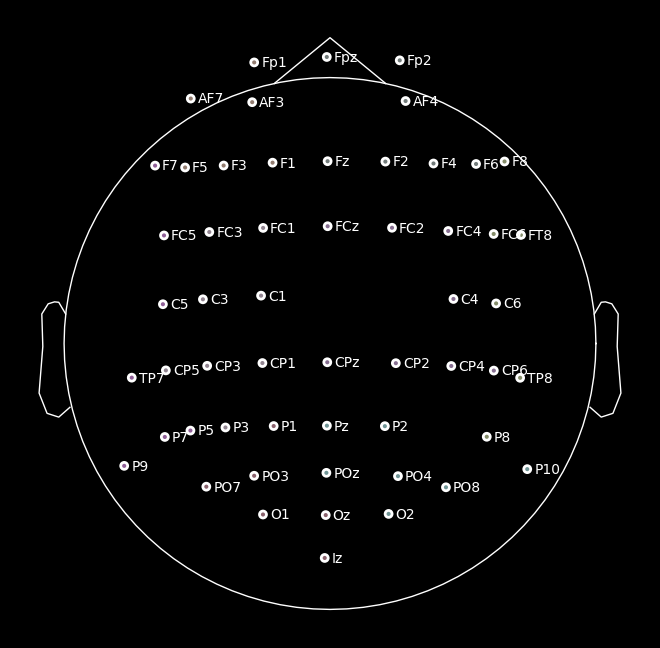

In [ ]:
raw_data[0].plot_sensors(show_names = True, kind = 'topomap', ch_groups = 'position');

Effective window size : 4.000 (s)


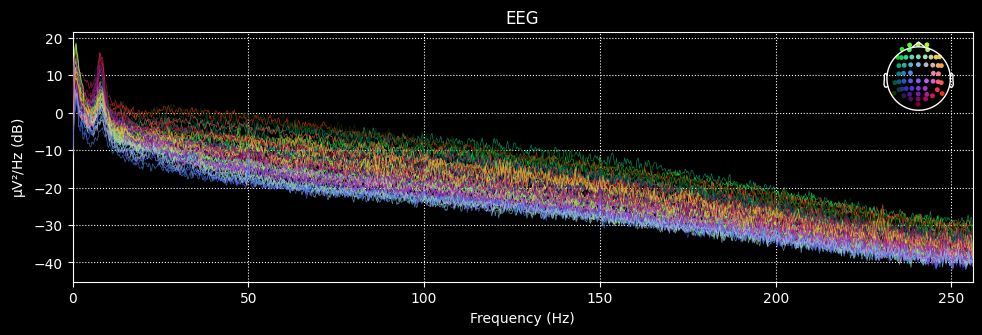

In [ ]:
raw_data[0].compute_psd().plot(picks = 'data', exclude = 'bads');

Aplicamos un filtro pasabandas, entre 1 y 200 Hz y un filtro Notch en 50Hz:

In [ ]:
# Filtro las señales
for raw in raw_data:
  raw._data = mne.filter.filter_data(raw._data, sfreq = fs, l_freq = 1, h_freq = 200, verbose = 'error')
  raw._data = mne.filter.notch_filter(raw._data, fs, 50, method='fir', p_value=0.05, phase='zero', fir_window='hamming', fir_design='firwin', verbose='error')

Seleccionamos los canales de interés basándonos en el hecho de que en su investigación, [(Dickinson, Jeste and Milne, 2022)](https://doi.org/10.1016/j.cortex.2021.09.022) utilizan los canales F3, F4, C3, C4, O1 y O2. Buscamos estos canales y, en los casos en los que no se encontraran, decidimos utilizar el inmediato más cercano para no perder información.

Además, también seleccionamos el canal Fpz como template para el ruido del EOG.

In [ ]:
target_dict = {'F3':['F3', 'FFC3h','FC3'],
               'C3': ['C3','C5','CPP3h'],
               'O1': ['O1','Oz'],
               'F4':['F4', 'FFC4h', 'AF4'],
               'C4':['C4','C6', 'CP4'],
               'O2': ['O2', 'POO2', 'Ol2h'],
               'Fpz':['Fpz','AF7'] #para EOG
               }

for raw in raw_data:
  channel_names = raw.info['ch_names']
  target_channels = []
  for key, values in target_dict.items():
    for value in values:
      if value in channel_names:
        target_channels.append(value)
        break
  remove_channels = [ch for ch in channel_names if ch not in target_channels]
  # idxs = mne.pick_channels(raw.info['ch_names'], include = target_channels, exclude = remove_channels)
  # mne.pick_info(raw.info, sel = idxs, copy = False, verbose = False)
  raw.drop_channels(remove_channels)
  remap = dict(zip (target_channels, list(target_dict.keys())))
  mne.rename_channels(raw.info, remap, verbose = 'error')

'''
for i, raw in enumerate(raw_data):
  print(f'{i}. {raw.ch_names}')
'''

raw_data.pop(53)
mne.channels.equalize_channels(raw_data, copy = False, verbose = 'error')

[<RawEEGLAB | 14Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 28Abby_Resting.fdt, 7 x 75206 (146.9 s), ~4.1 MB, data loaded>,
 <RawEEGLAB | 42Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 16Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 53Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 31Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 6Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 12Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 19Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 51Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 43Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 9Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, data loaded>,
 <RawEEGLAB | 22Abby_Resting.fdt, 7 x 81921 (160.0 s), ~4.4 MB, da

###ICA (Análisis de Componentes Independientes)
Aplicamos ICA con el objetivo de eliminar artefactos, principalmente el ruido del EOG, y reconstruir la señal limpia. Para ello, utilizamos una gran variedad de funciones de la librería MNE.

No contábamos con un registro de EOG, por lo que decidimos tomar Fpz como canal representativo para movimientos oculares debido a su posición frontal.

Se calcularon las 7 componentes principales de cada sujeto y luego se eliminaron de los registros las correspondientes a Fpz.

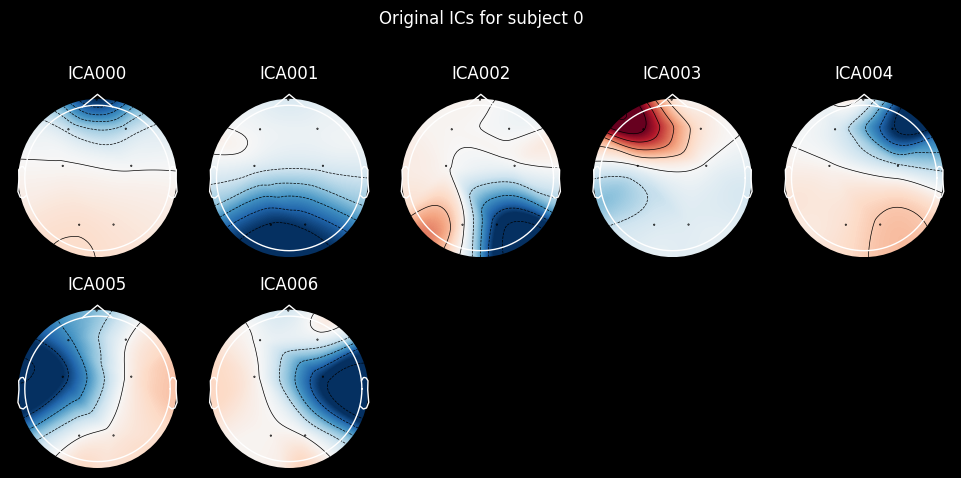

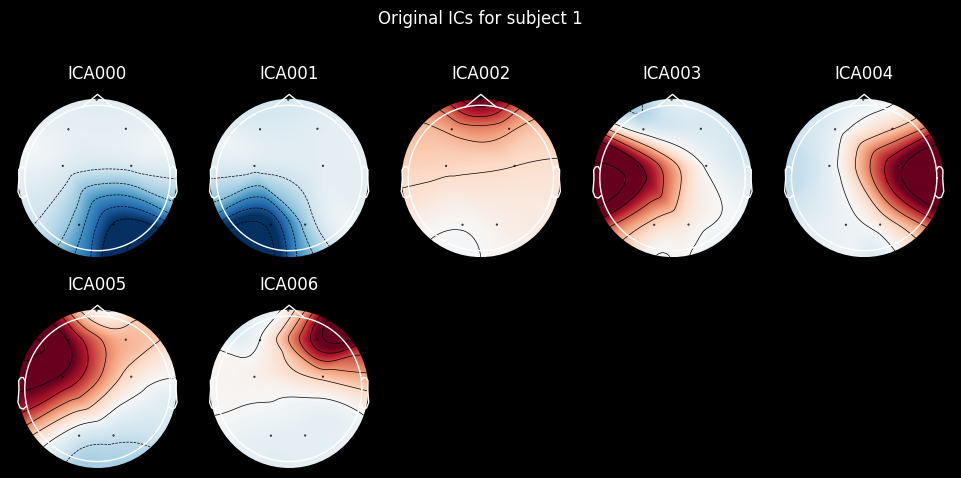

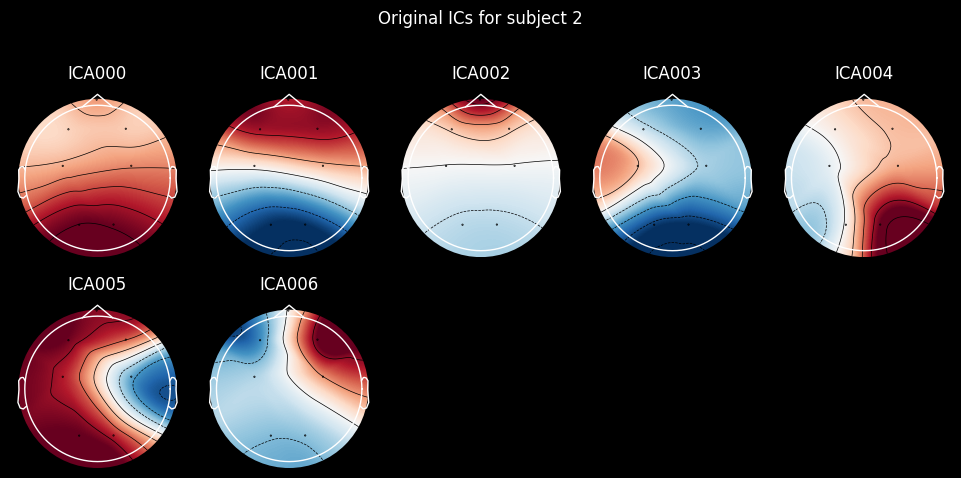

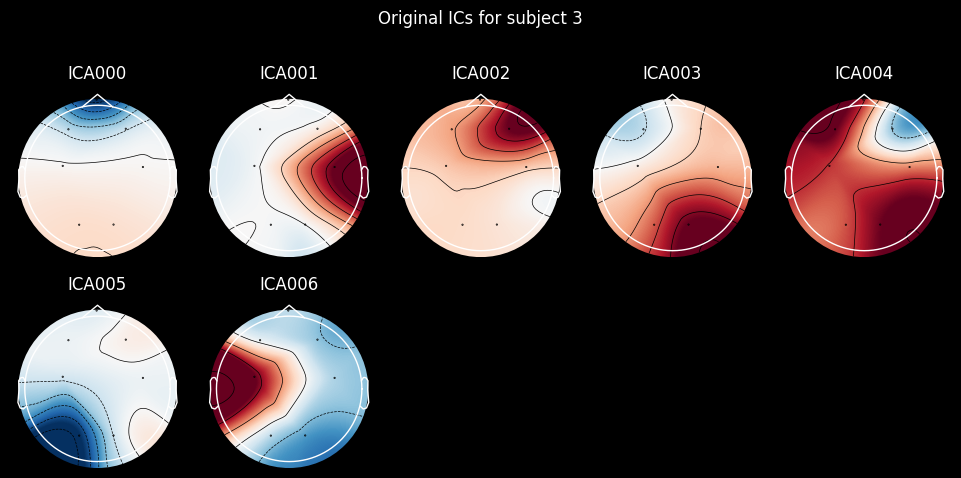

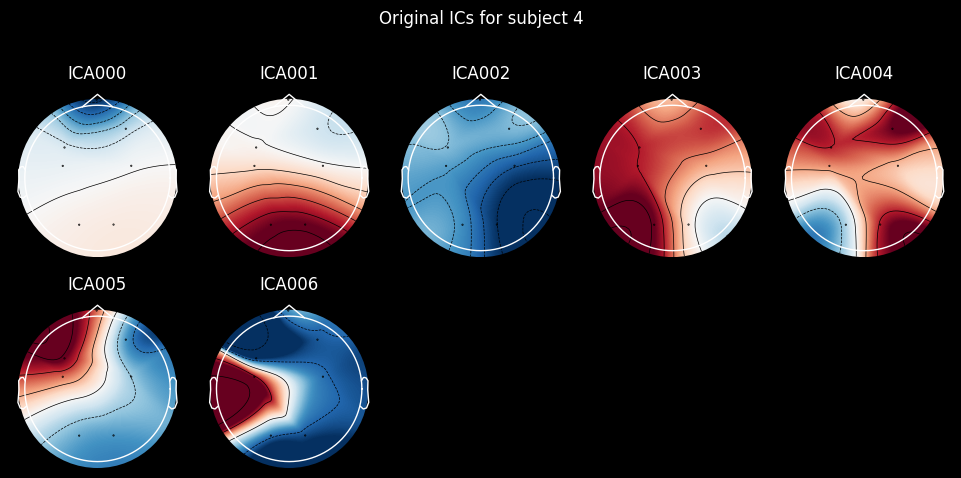

...

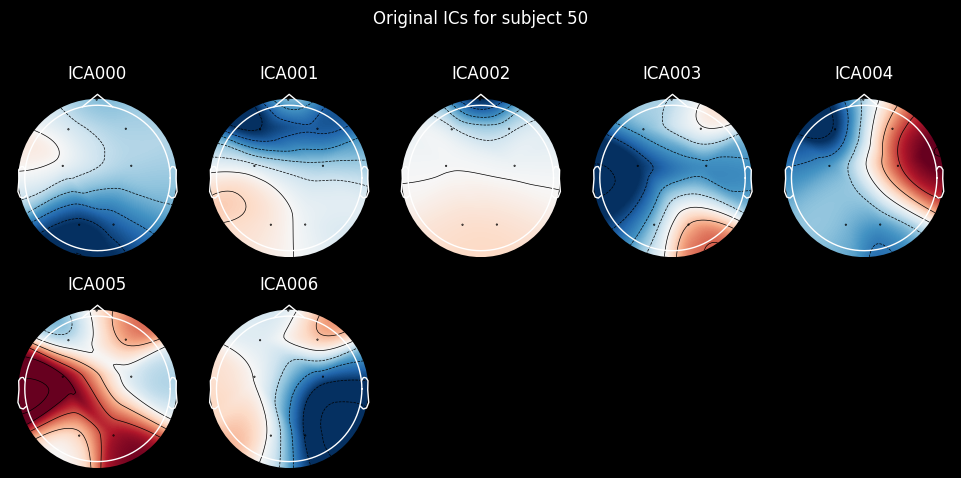

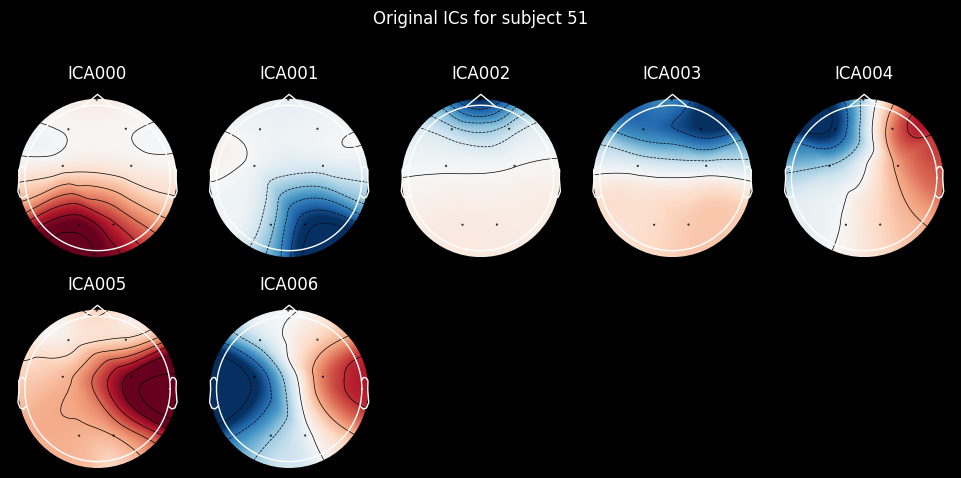

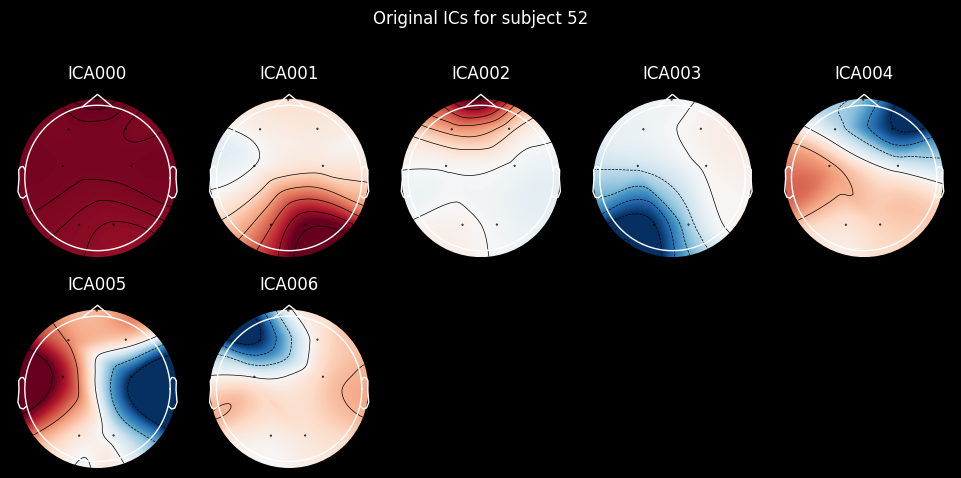

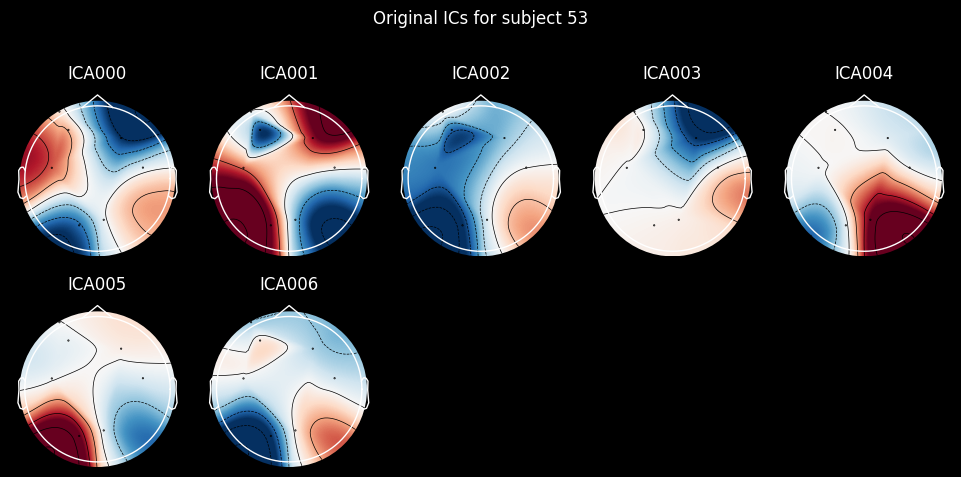

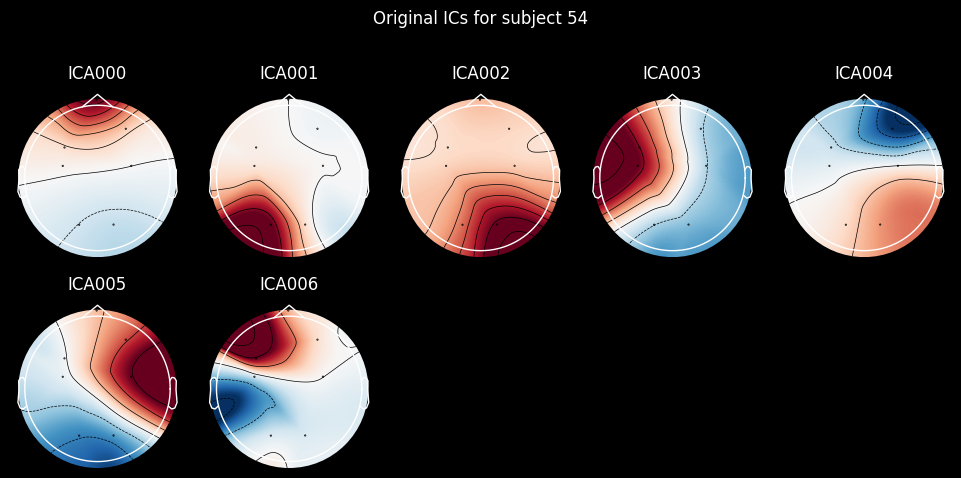

In [ ]:
icas = []

for i in range(len(raw_data)):
  # Apply ICA to the data
  ica = mne.preprocessing.ICA(n_components=len(raw_data[i].ch_names), random_state=0)
  ica.fit(raw_data[i], verbose = 'error')
  icas.append(ica)

  orig_fig = ica.plot_components(show=False)
  orig_fig.suptitle(f'Original ICs for subject {i}')
  plt.show()

Realizamos un gráfico de barras que nos permitirá identificar qué componentes de las señales corresponden al EOG y efectivamente elminarlos de la señal.

Subject 0:


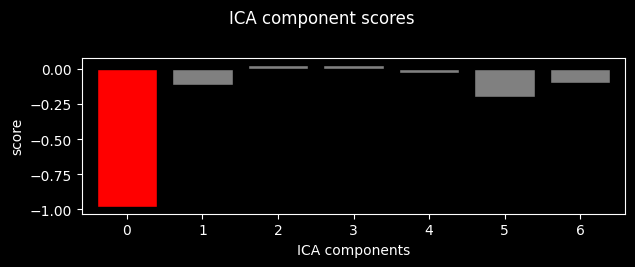

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 1:


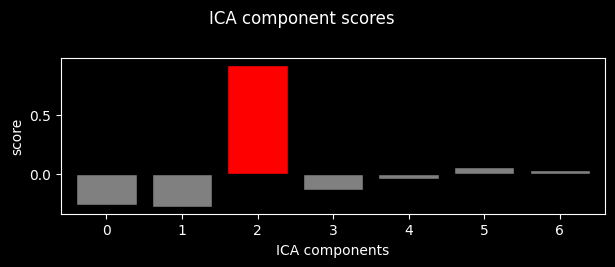

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 2:


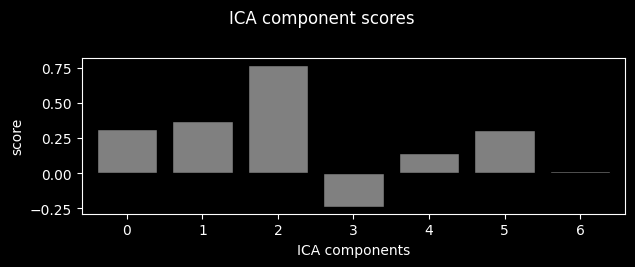

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 3:


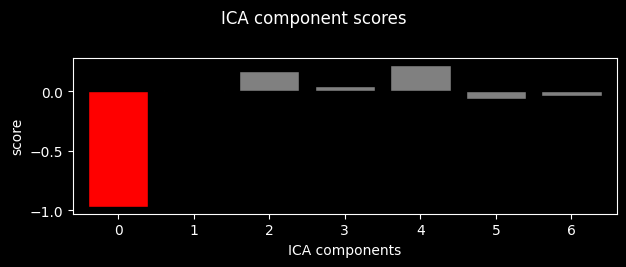

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 4:


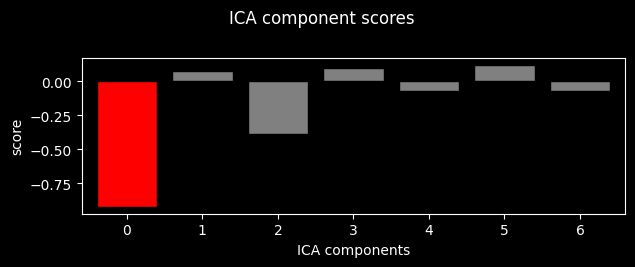

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 5:


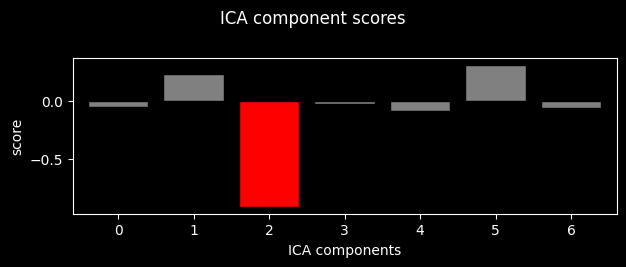

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 6:


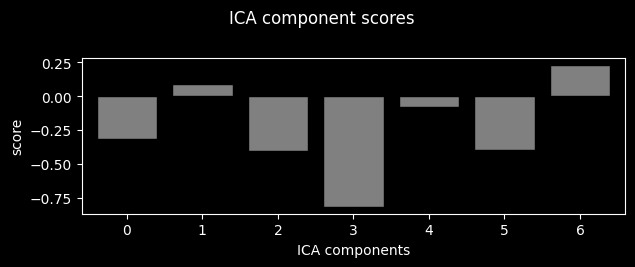

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 7:


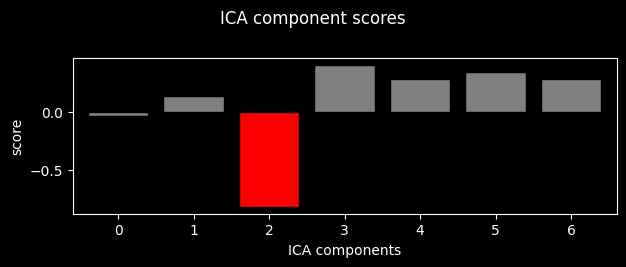

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 8:


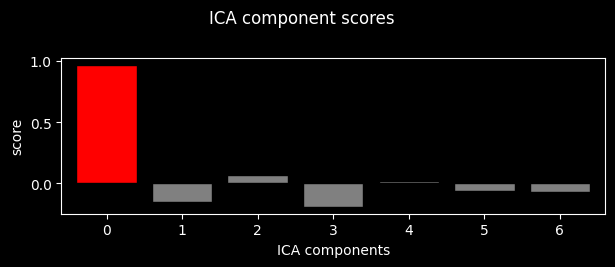

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 9:


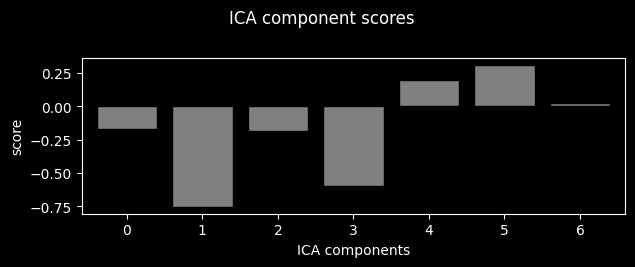

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 10:


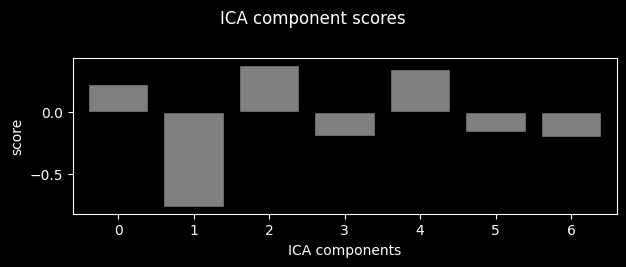

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 11:


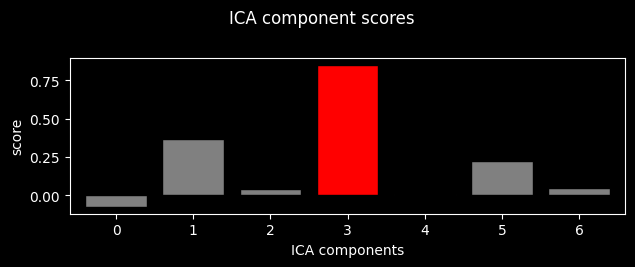

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 12:


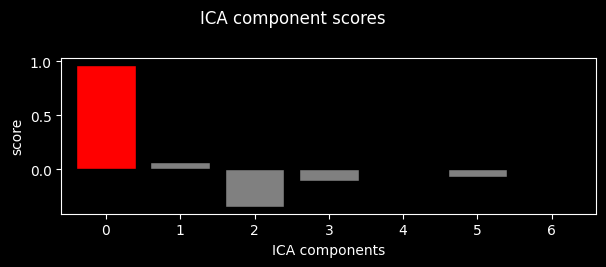

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 13:


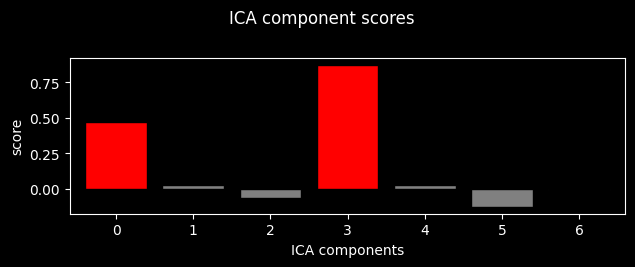

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 2 ICA components
    Projecting back using 7 PCA components
Subject 14:


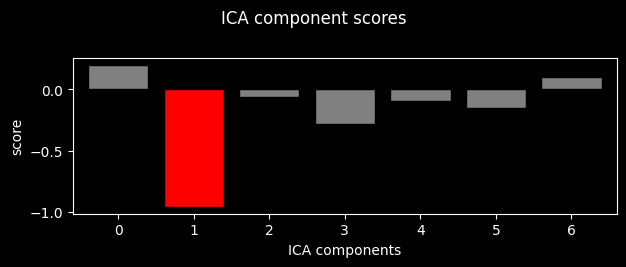

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 15:


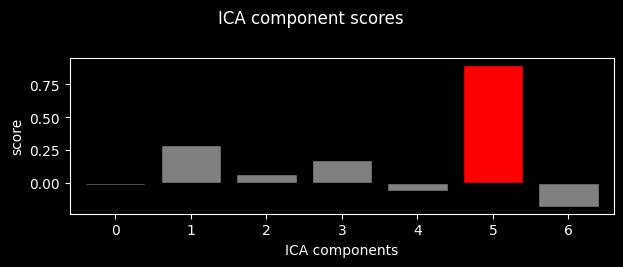

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 16:


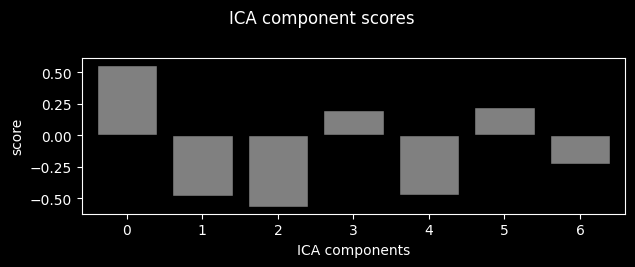

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 17:


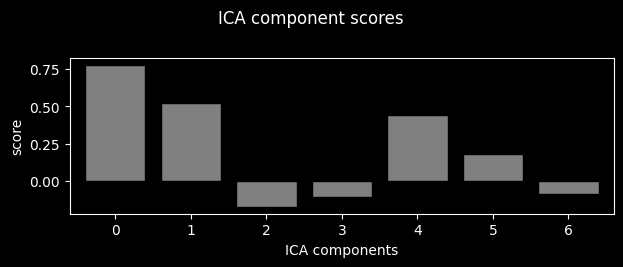

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 18:


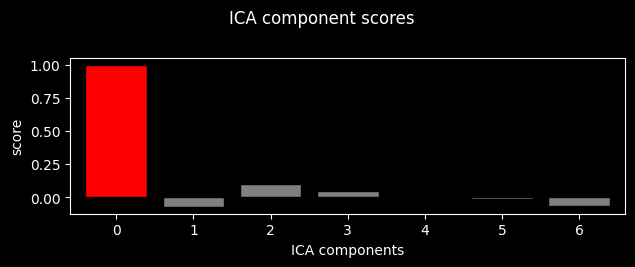

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 19:


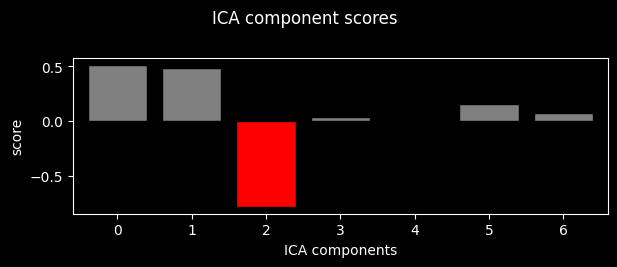

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 20:


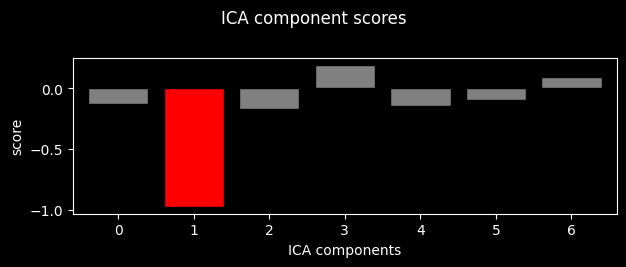

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 21:


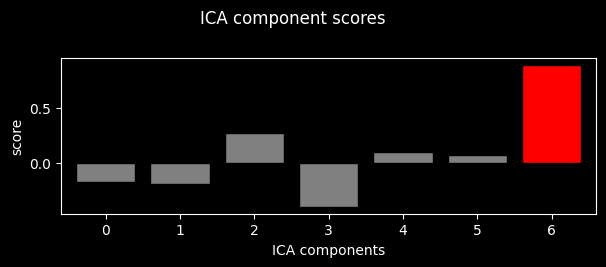

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 22:


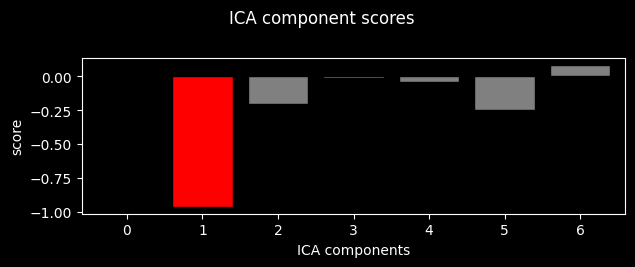

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 23:


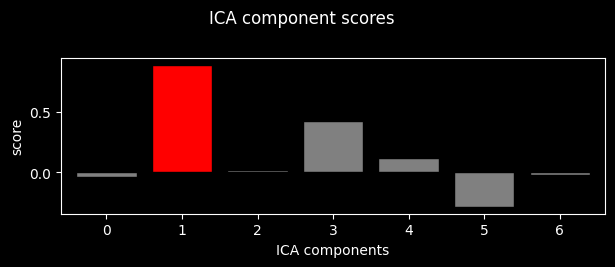

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 24:


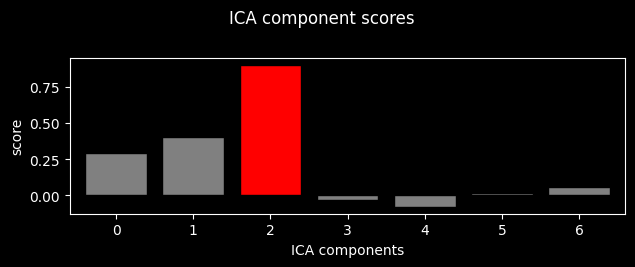

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 25:


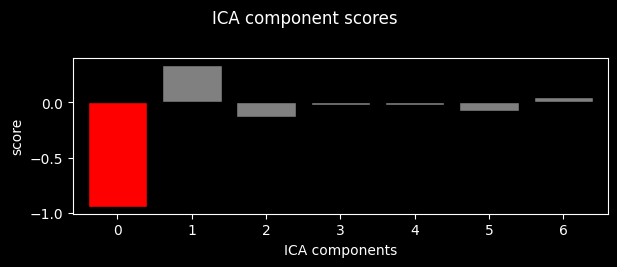

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 26:


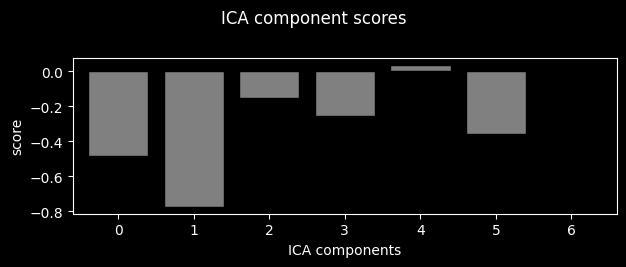

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 27:


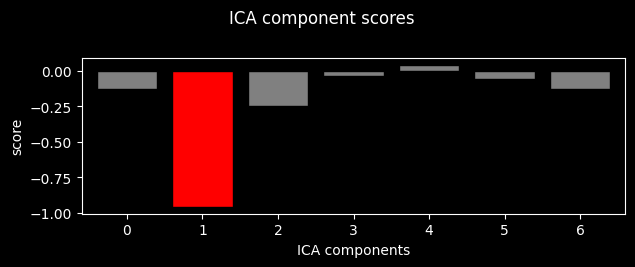

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 28:


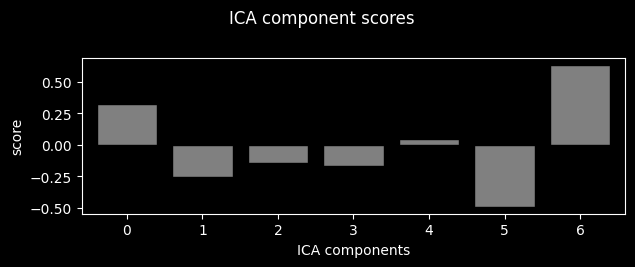

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 29:


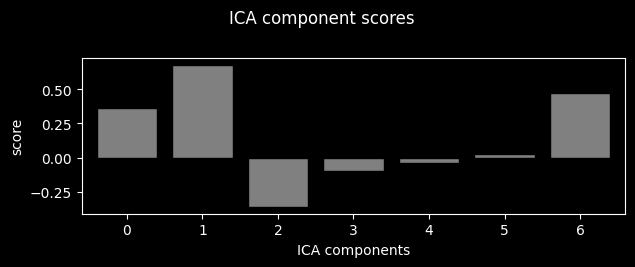

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 30:


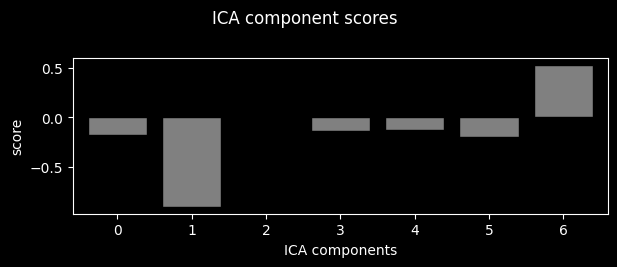

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 31:


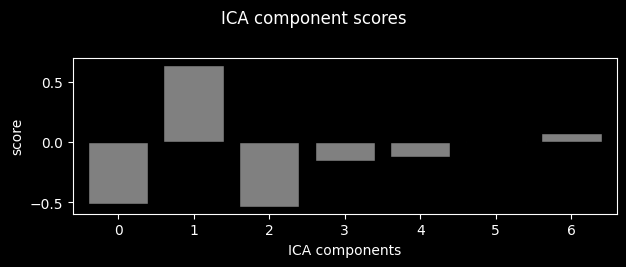

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 32:


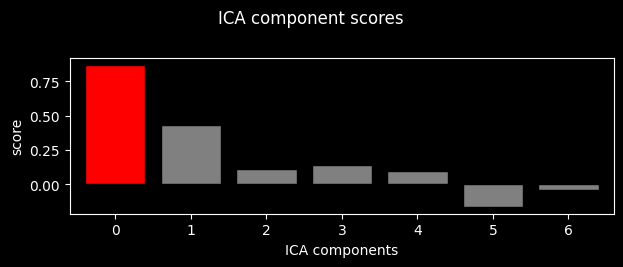

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 33:


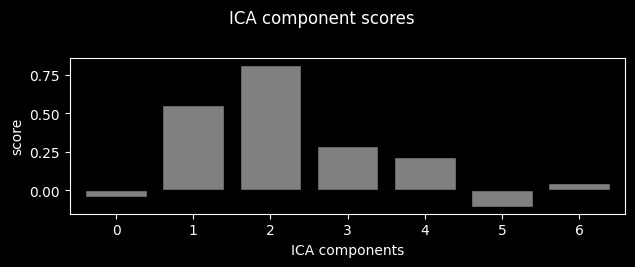

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 34:


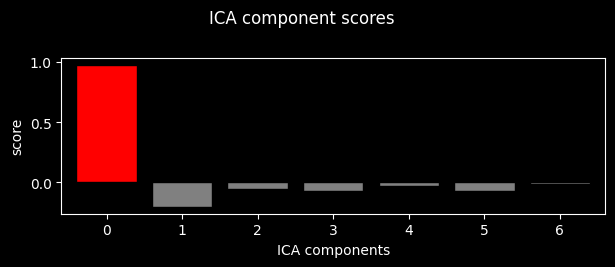

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 35:


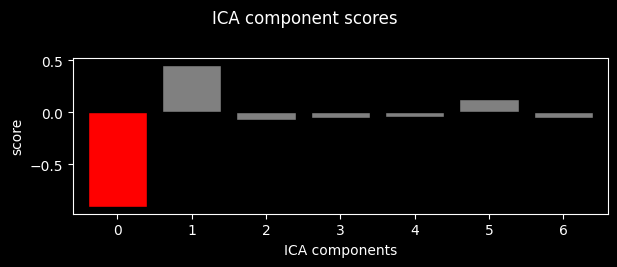

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 36:


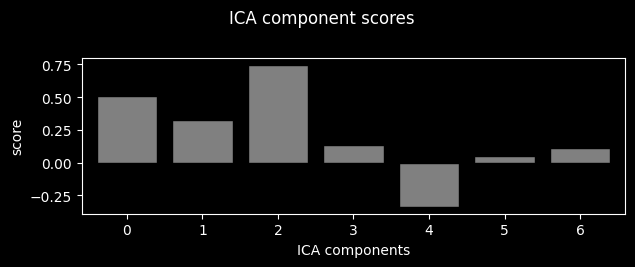

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 37:


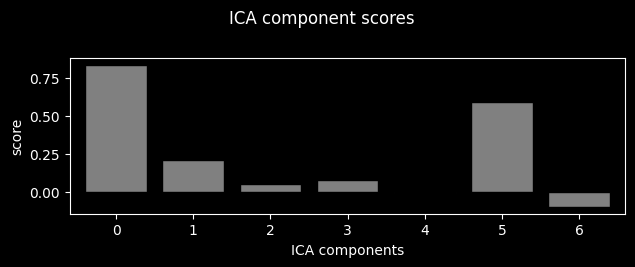

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 38:


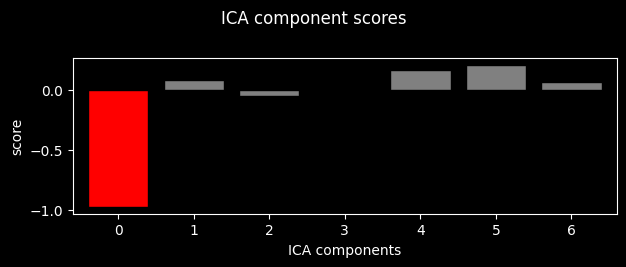

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 39:


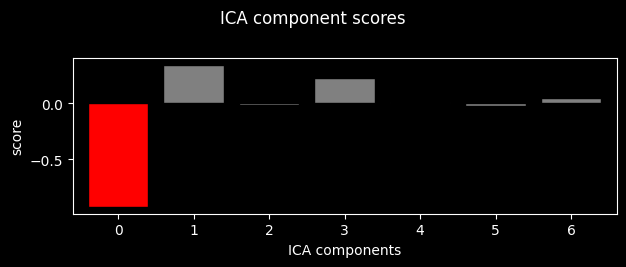

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 40:


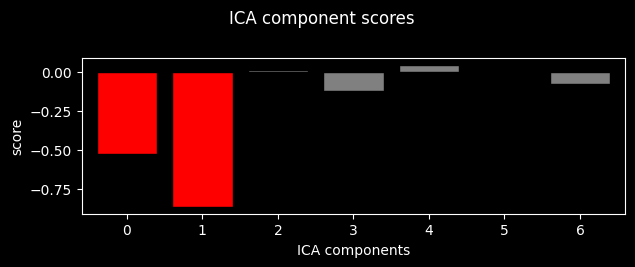

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 2 ICA components
    Projecting back using 7 PCA components
Subject 41:


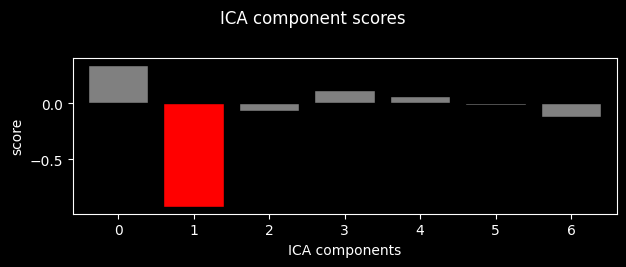

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 42:


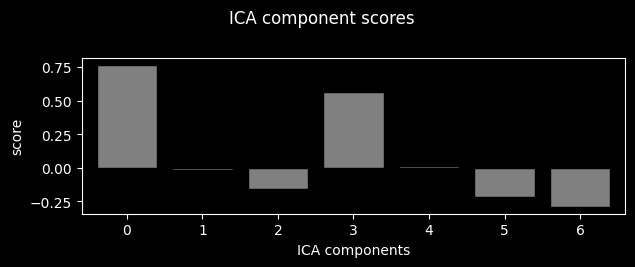

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 43:


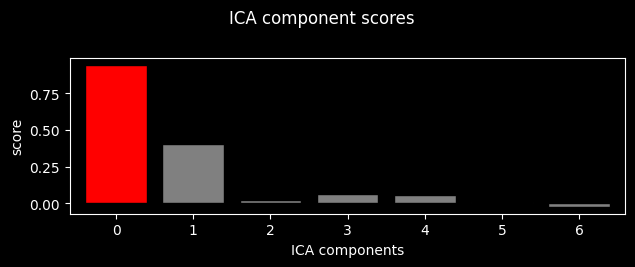

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 44:


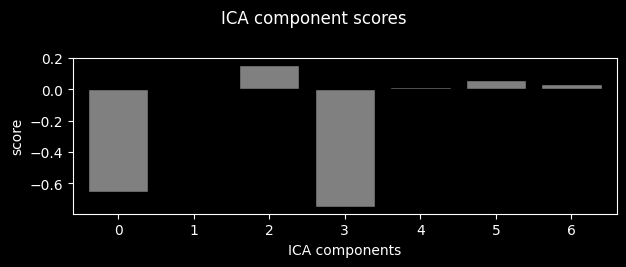

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 45:


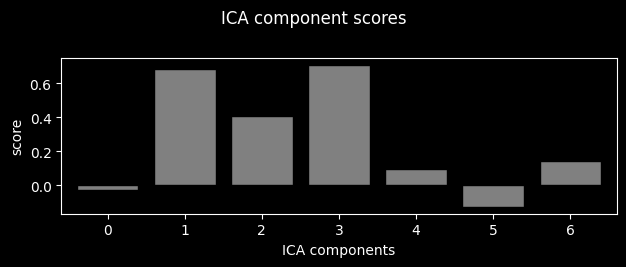

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 46:


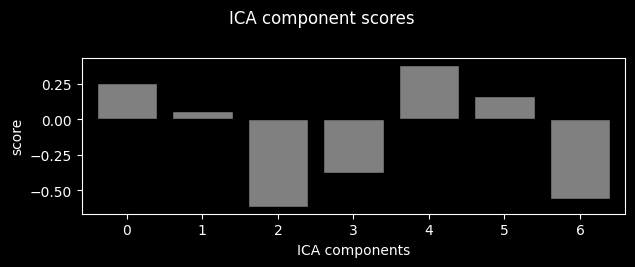

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 47:


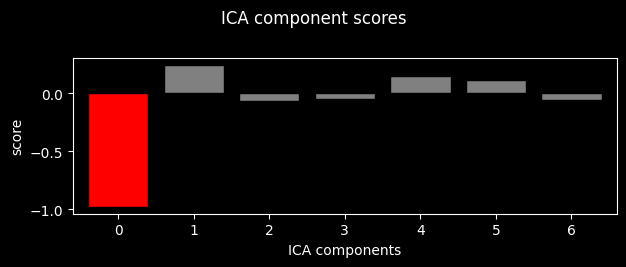

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 48:


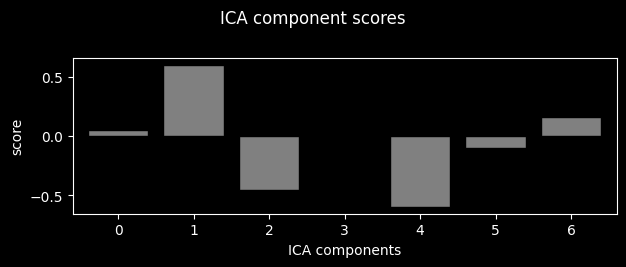

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 49:


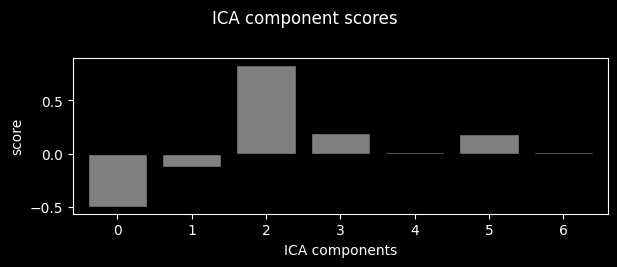

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 50:


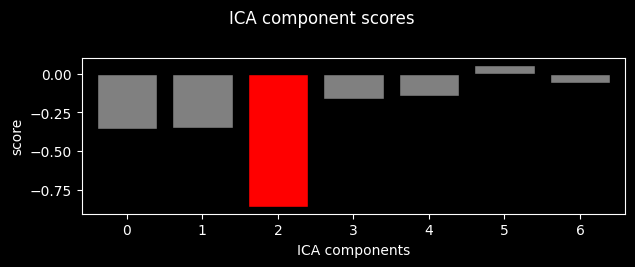

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 51:


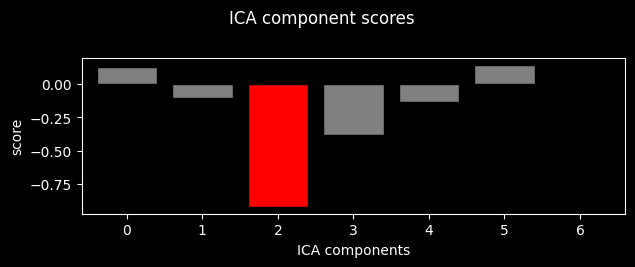

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 52:


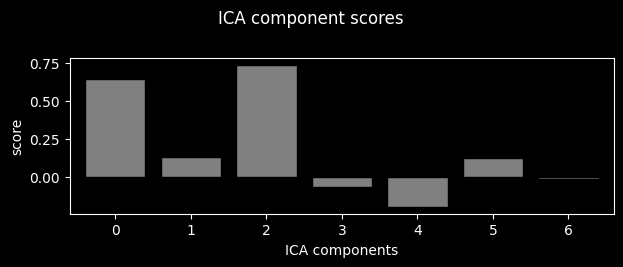

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 0 ICA components
    Projecting back using 7 PCA components
Subject 53:


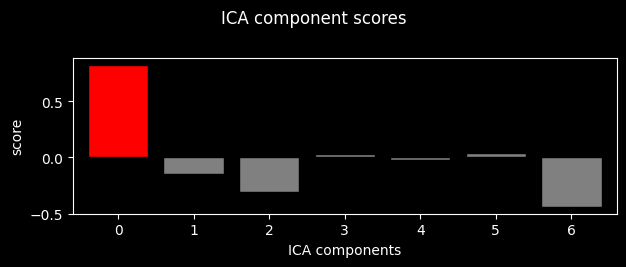

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components
Subject 54:


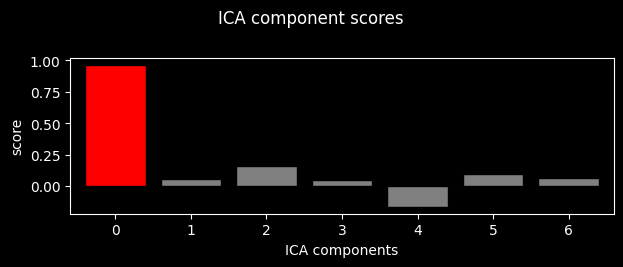

Applying ICA to Raw instance
    Transforming to ICA space (7 components)
    Zeroing out 1 ICA component
    Projecting back using 7 PCA components


In [ ]:
for i, (raw, ica) in enumerate(zip(raw_data, icas)):
  ica.exclude = []

  eog_inds, eog_scores = ica.find_bads_eog(raw, ch_name="Fpz", threshold = 2, reject_by_annotation = False, verbose = 'error')
  ica.exclude = eog_inds

  # barplot of ICA component "EOG match" scores
  print(f'Subject {i}:')
  ica.plot_scores(eog_scores);
  raw = ica.apply(raw) # Remove "bad" components


Graficamos las señales de los canales luego de la eliminación de los artefactos.

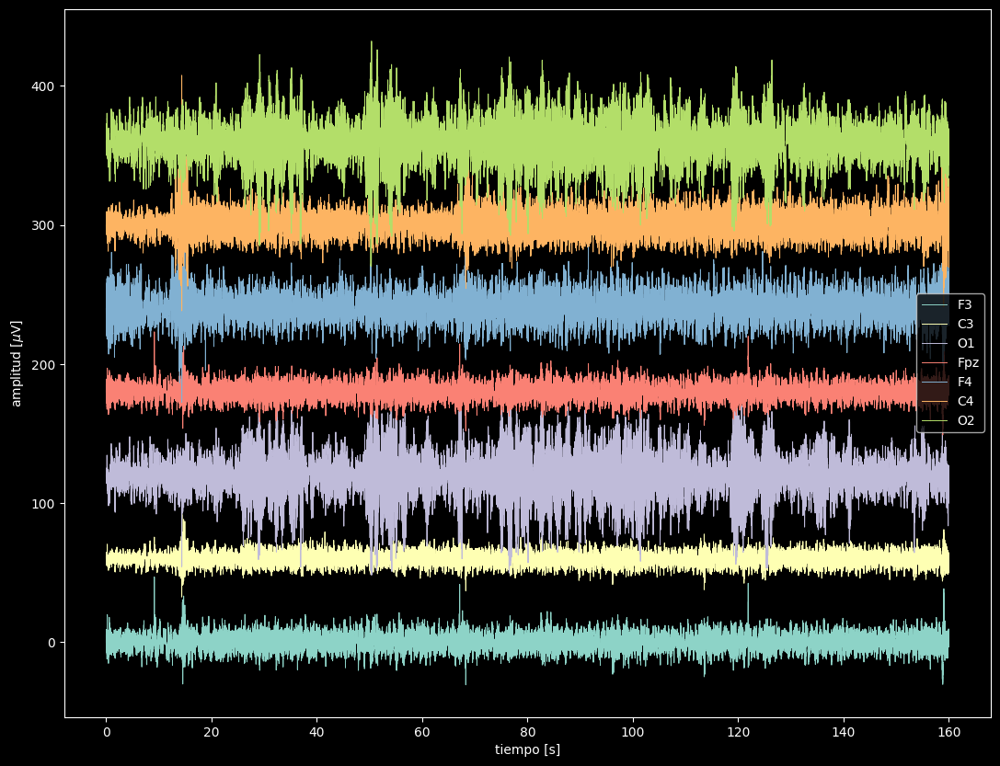

In [ ]:
fig, ax = plt.subplots(figsize=(13,10))

labels = raw_data[1].ch_names
t = np.arange(0, raw_data[22]._data.shape[1]/fs, 1/fs)

for i in range(raw_data[22]._data.shape[0]):
  ax.plot(t, raw_data[22]._data[i,:]*1e6 + i*60, linewidth= 0.7, label = labels[i])

plt.legend(loc= 'right')
ax.set_xlabel('tiempo [s]')
ax.set_ylabel('amplitud [$\mu$V]')
plt.show()

Effective window size : 4.000 (s)


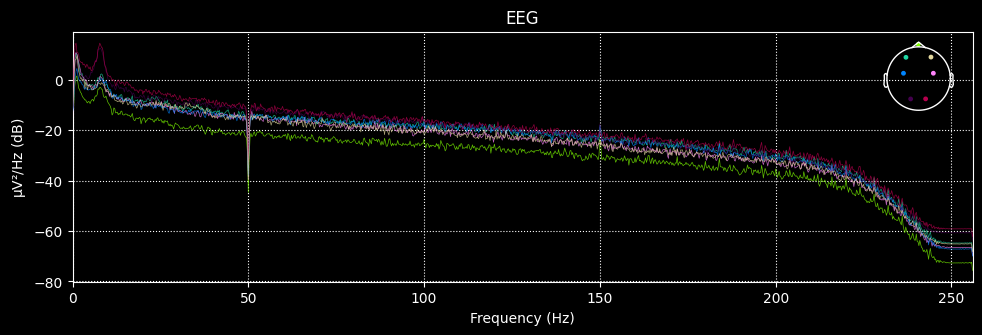

In [ ]:
raw_data[0].compute_psd().plot(picks = 'data', exclude = 'bads');

## Feature Extraction

Antes de avanzar, analizamos los archivos para saber cuáles correspondían a pacientes con autismo y cuáles no y con esa información construimos el DataFrame con el que vamos a trabajar.

In [ ]:
ASD_files = list(range(29))
ASD_files.pop(22)

non_ASD_files = [22]
non_ASD_files += [i for i in range(29,57)]

eegs = []

for i, eeg in enumerate(raw_data):
  eeg = {}
  eeg['subject'] = f'subject_{i}'
  if i in ASD_files:
    eeg['label'] = 'ASD'
  else:
    eeg['label'] = 'non ASD'
  eegs.append(eeg)

df = pd.DataFrame(eegs)
df.head(5)

,subject,label
0,subject_0,ASD
1,subject_1,ASD
2,subject_2,ASD
3,subject_3,ASD
4,subject_4,ASD


In [ ]:
df.tail(5)

,subject,label
50,subject_50,non ASD
51,subject_51,non ASD
52,subject_52,non ASD
53,subject_53,non ASD
54,subject_54,non ASD


Promediamos los canales para obtener uno correspondiente a cada zona de interés (frontal,  central, y occipital):

- F3 y F4 → F
- C3 y C4 → C
- O1 y O2 → O

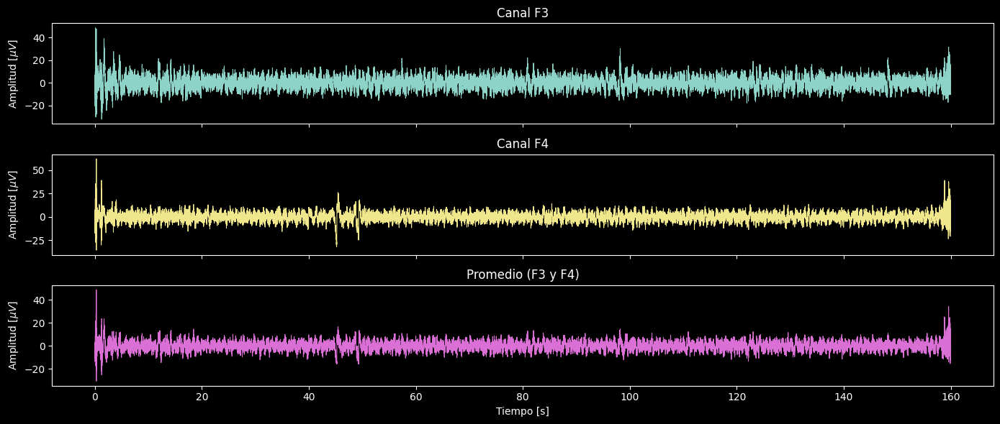

In [ ]:
def ch_average(name1, name2, raw_data):
  data_avg = []
  for i, raw in enumerate(raw_data):
    ch_1 = raw.ch_names.index(name1)
    ch_2 = raw.ch_names.index(name2)

    data_ch1 = raw._data[ch_1, :]
    data_ch2 = raw._data[ch_2, :]

    avg = (data_ch1 + data_ch2) / 2
    data_avg.append(avg)

  return data_avg

data_avgF = ch_average('F3', 'F4', raw_data)
data_avgC = ch_average('C3', 'C4', raw_data)
data_avgO = ch_average('O1', 'O2', raw_data)

# Gráfico uno para ver como quedo
fig, axs = plt.subplots(3, 1, figsize=(14, 6), sharex= True)

# Canal F3
axs[0].plot(raw_data[0].times, raw_data[0]._data[raw_data[0].ch_names.index('F3'), :]*1e6, linewidth = 0.7)
axs[0].set_title('Canal F3')

# Canal F4
axs[1].plot(raw_data[0].times, raw_data[0]._data[raw_data[0].ch_names.index('F4'), :]*1e6, linewidth = 0.7, color = 'khaki')
axs[1].set_title('Canal F4')

# Canal promediado
axs[2].plot(raw_data[0].times, data_avgF[0]*1e6, linewidth = 0.7, color ='orchid')
axs[2].set_title('Promedio (F3 y F4)')
axs[2].set_xlabel('Tiempo [s]')

for ax in axs:
  ax.set_ylabel('Amplitud [$\mu V$]')

plt.tight_layout()
plt.show()

Graficamos su potencia espectral para analizar qué frecuencias obtenemos luego del procesamiento de la señal.

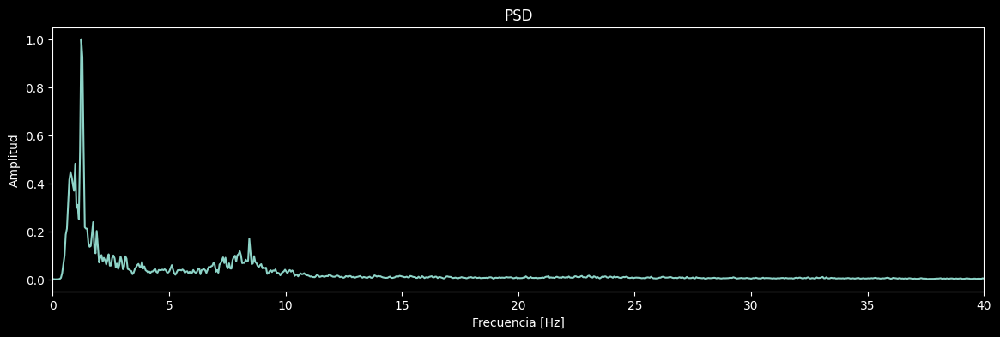

In [ ]:
nperseg = 10000
nfft = 10000
f, Pxx = scipy.signal.welch(data_avgF[0], fs, window='hamming', nperseg=nperseg, noverlap=nperseg//2, nfft=nfft)

plt.figure(figsize=(14,4))
plt.plot(f, Pxx/max(Pxx))
plt.xlabel('Frecuencia [Hz]')
plt.ylabel('Amplitud')
plt.title('PSD')
plt.xlim(0, 40)
plt.show()

### Feature 1: PAF
Calculamos el pico de frecuencia alfa. Analizamos el PSD obtenido a partir de Welch para encontrar la frecuencia correspondiente al máximo del espectro en el intervalo alpha.

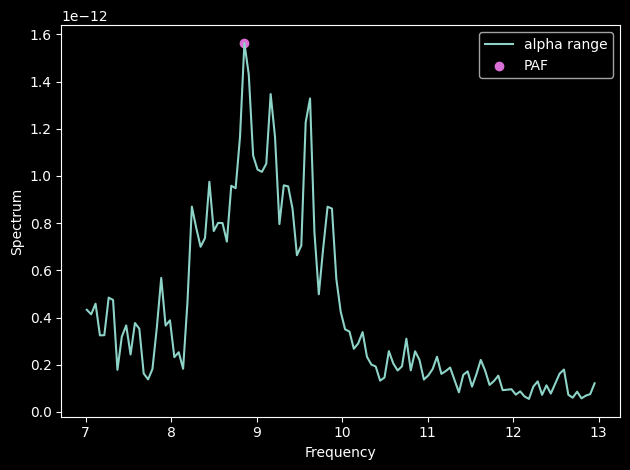

In [ ]:
def PAF(data, plot = False):
  psd, freq = mne.time_frequency.psd_array_welch(data, sfreq=fs, fmin=7, fmax=13, n_per_seg = nperseg, n_fft = nfft, verbose = False)
  max_idx = np.argmax(psd)
  paf = freq[max_idx]

  if plot:
    plt.plot(freq, psd, label = 'alpha range')
    plt.scatter(paf, psd[max_idx], label = 'PAF', color = 'orchid')
    plt.xlabel('Frequency')
    plt.ylabel('Spectrum')
    plt.legend()
    plt.tight_layout()
    plt.show()

  return paf

paf_ej = PAF(data_avgF[40], plot = True)

Siguiendo la metodología de Dickinson (2022) calculamos el PAF en las distintas regiones y guardamos un promedio de los tres para cada sujeto en el data frame:

In [ ]:
pafs = []

for f, c, o in zip(data_avgF, data_avgC, data_avgO):
  PAF_f = PAF(f)
  PAF_c = PAF(c)
  PAF_o = PAF(o)

  paf = (PAF_f + PAF_c + PAF_o) / 3
  pafs.append(paf)

df['PAF'] = pafs

### Feature 2: PSD de cada banda

Calculamos el área bajo la curva de cada banda del PSD, lo cual se corresponde con la potencia absoluta de la banda.



In [ ]:
bands = {
  "beta": (13,30),
  "alpha": (7,13), #7 a 13 para acomodar PAF
  "theta": (4,7),
  "delta": (0.5,4),
  "gamma": (30, 200) }

def get_powers(data_avg, bands):
  areas = {}

  for band in bands:
    areas[band] = []

  for i in range(len(data_avg)):
    for band, limits in bands.items():
      low, high = limits
      psd, _ = mne.time_frequency.psd_array_welch(data_avg[i], fs, fmin=low, fmax=high, verbose=False)
      area = psd.sum()
      areas[band].append(area)

  return areas

areasF = get_powers(data_avgF, bands)
areasC = get_powers(data_avgC, bands)
areasO = get_powers(data_avgO, bands)

Por otro lado, se calcula el valor de la densidad de potencias relativas entre cada banda y el resto:

In [ ]:
def rel_powers(data_avg, area, bands):
  psds_rel = {band: [] for band in bands}
  for i in range (len(data_avg)):
    total_power = 0
    for band, values in area.items():
      total_power += values[i]
    for band, values in area.items():
      psds_rel[band].append(values[i]/total_power)

  return psds_rel

psdF_rel = rel_powers(data_avgF, areasF, bands)
psdC_rel = rel_powers(data_avgC, areasC, bands)
psdO_rel = rel_powers(data_avgO, areasO, bands)

In [ ]:
for band in bands:
    for i in range(len(psdF_rel[band])):
        df.loc[i, f"PSDrel_F_{band}"] = psdF_rel[band][i]
        df.loc[i, f"PSDrel_C_{band}"] = psdC_rel[band][i]
        df.loc[i, f"PSDrel_O_{band}"] = psdO_rel[band][i]

### Feature 3: U shape

Se estudia la U-shape de frecuencias anormales que se produce por las variaciones en el PSD:

* Exceso de delta, theta, beta y gamma (extremos)
* Disminución de alpha (centro)

Al quedar exceso de potencia en los extremos y, en comparación, menor potencia en el centro, se obtiene una U. Se realiza un *scatter plot* para analizar la distribución de las frecuencias relativas. Más especificamente, buscamos analizar la posición de alfa con respecto a las demás.

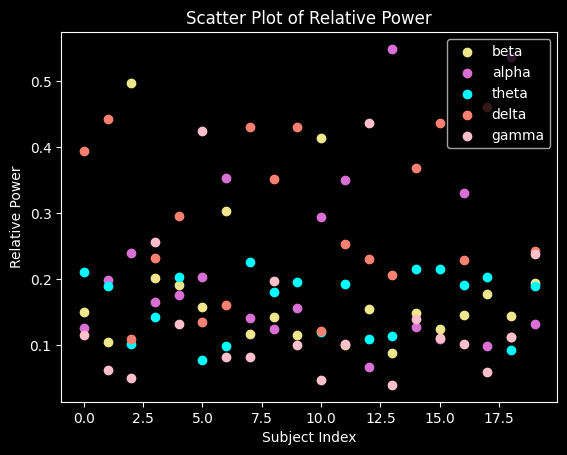

In [ ]:
colors = ['khaki', 'orchid', 'aqua', 'salmon', 'pink']

for i, (band, values) in enumerate(psdC_rel.items()):
    plt.scatter(range(20), values[35:], color=colors[i], label=band)

plt.xlabel('Subject Index')
plt.ylabel('Relative Power')
plt.title('Scatter Plot of Relative Power')
plt.legend()
plt.show()

Para obtener un dato cuantificable respecto a la U-shape calculamos proporción relativa entre la banda alpha y el resto. Siguiendo la metodología de Wang (2013) calculamos esto solo para las regiones frontal y central.

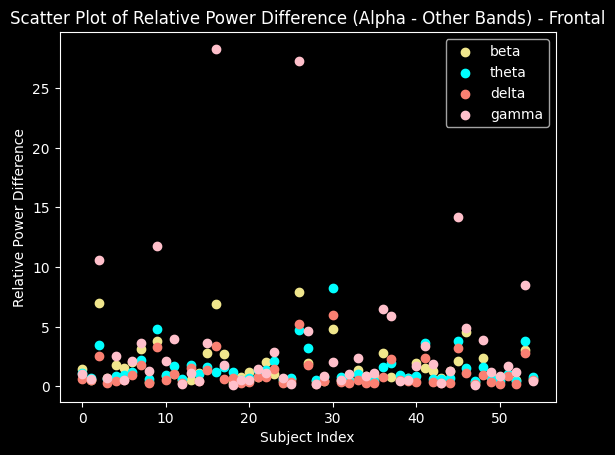

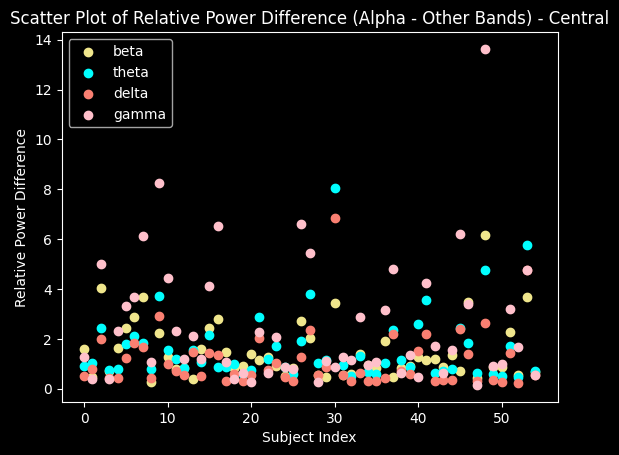

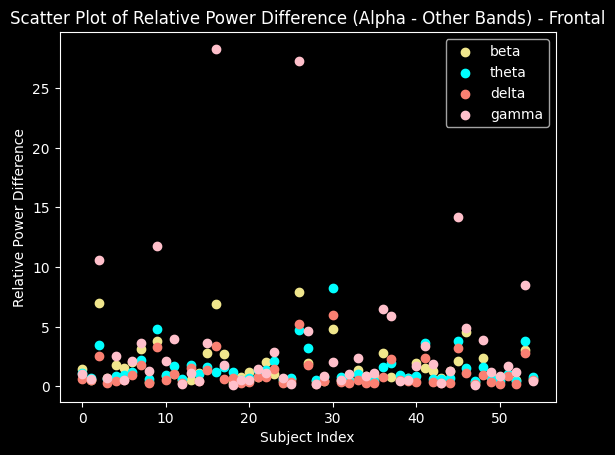

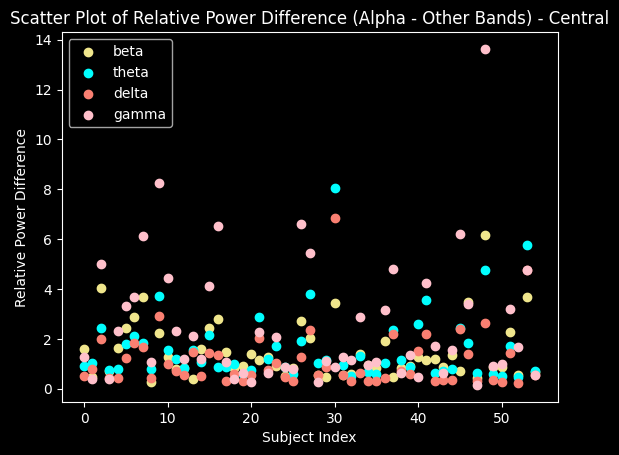

In [ ]:
def alpha_diff(data, title):
  #Potencia relativa alpha menos las demas
  power_diff = {}
  alpha_values = data['alpha']  #Potencia relativa de alpha

  for band, values in data.items():
    diff_values = [alpha / other for alpha, other in zip(alpha_values, values)]
    power_diff[band] = diff_values

  for i, (band, values) in enumerate(power_diff.items()):
    if band != 'alpha':
      plt.scatter(range(len(values)), values, color=colors[i], label=band)

  plt.xlabel('Subject Index')
  plt.ylabel('Relative Power Difference')
  plt.title(f'Scatter Plot of Relative Power Difference (Alpha - Other Bands) - {title}')
  plt.legend()
  plt.show()
  return power_diff

AreldiffF = alpha_diff(psdF_rel, 'Frontal')
AreldiffC = alpha_diff(psdC_rel, 'Central')
AabsdiffF = alpha_diff(areasF, 'Frontal')
AabsdiffC = alpha_diff(areasC, 'Central')

for band in bands:
  if band != 'alpha':
    for i in range(len(psdF_rel[band])):
        df.loc[i, f"ADiff_relF{band}"] = AreldiffF[band][i]
        df.loc[i, f"ADiff_relC{band}"] = AreldiffC[band][i]


### Feature 4: α/δ Ratio

Siguiendo la misma idea, ahora calculamos la proporción absoluta entre las bandas alpha y delta:

In [ ]:
def Ratio(data):
  psd_alpha, _ = mne.time_frequency.psd_array_welch(data._data, sfreq = fs, fmin = 7, fmax = 13, verbose = False)
  psd_delta, _ = mne.time_frequency.psd_array_welch(data._data, sfreq = fs, fmin = 0.5, fmax = 4, verbose = False)

  ratio = psd_alpha.sum() / psd_delta.sum()
  return ratio

ratios = []
for i, raw in enumerate(raw_data):
  r = Ratio(raw)
  ratios.append(r)

df['ratios a/d'] = ratios

## Data Exploration

Antes de comenzar a evaluar que algoritmo utilizar, decidimos explorar más en profundidad los valores y distribuciones de los features extraídos.

In [ ]:
df.describe()

,PAF,PSDrel_F_beta,PSDrel_C_beta,PSDrel_O_beta,PSDrel_F_alpha,PSDrel_C_alpha,PSDrel_O_alpha,PSDrel_F_theta,PSDrel_C_theta,PSDrel_O_theta,...,PSDrel_O_gamma,ADiff_relFbeta,ADiff_relCbeta,ADiff_relFtheta,ADiff_relCtheta,ADiff_relFdelta,ADiff_relCdelta,ADiff_relFgamma,ADiff_relCgamma,ratios a/d
count,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,...,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000,55.000000
mean,9.363394,0.166694,0.186023,0.159814,0.221782,0.225495,0.355272,0.167868,0.165371,0.156240,...,0.109326,1.716650,1.506582,1.519243,1.618193,1.081578,1.140677,3.347290,2.519274,1.825626
std,1.000212,0.072227,0.095069,0.077445,0.142766,0.119572,0.200140,0.048137,0.047969,0.058067,...,0.083695,1.711848,1.164421,1.433688,1.421445,1.231490,1.178036,5.625285,2.515832,2.267542
min,7.099733,0.063297,0.085266,0.037290,0.060709,0.067694,0.104573,0.056981,0.045464,0.029897,...,0.014455,0.274359,0.289360,0.435895,0.486771,0.190675,0.215040,0.132045,0.154721,0.236258
25%,8.712533,0.117474,0.121493,0.109003,0.116090,0.129414,0.187730,0.134939,0.127776,0.121907,...,0.049971,0.683648,0.750207,0.670078,0.765185,0.334354,0.420958,0.579099,0.863829,0.525873
50%,9.318400,0.146147,0.150412,0.148192,0.166459,0.182090,0.316903,0.167887,0.173645,0.142634,...,0.081323,1.054707,1.165327,0.949686,1.053223,0.532931,0.647553,1.263090,1.335726,1.005294
75%,9.975467,0.207956,0.207492,0.183755,0.298273,0.322664,0.504890,0.195050,0.194818,0.186011,...,0.151651,2.061213,1.962779,1.662186,1.879794,1.232670,1.464733,3.510977,3.545686,2.337288
max,11.946667,0.383495,0.498080,0.428711,0.637692,0.548976,0.844020,0.353444,0.334939,0.338362,...,0.341382,7.902539,6.159039,8.228485,8.057978,5.980046,6.855402,28.287414,13.631110,12.767586


Realizamos un pairplot para ver la distribución de las distintas features con respecto a la clasificación target:

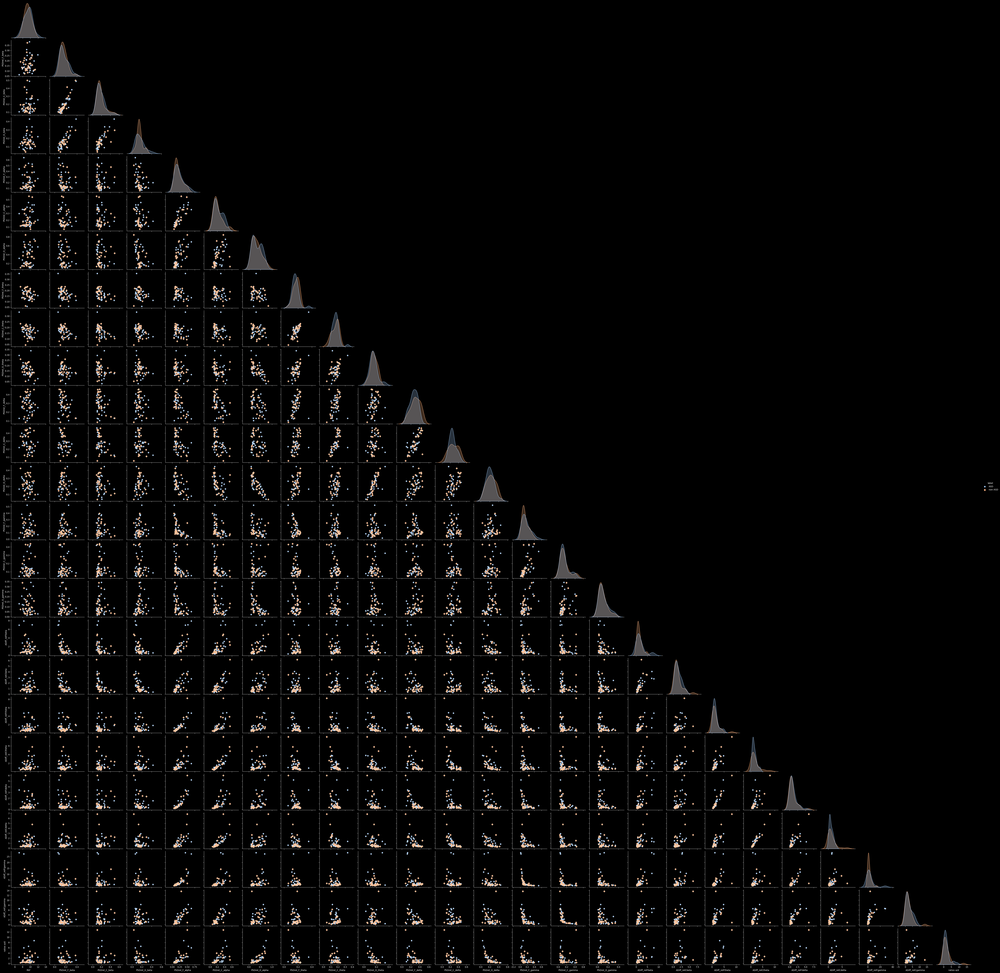

In [ ]:
sns.pairplot(df, hue = 'label', palette = 'pastel', markers = ['o', 'D'], corner = True);

Hacemos la matriz de correlación entre todas las features:

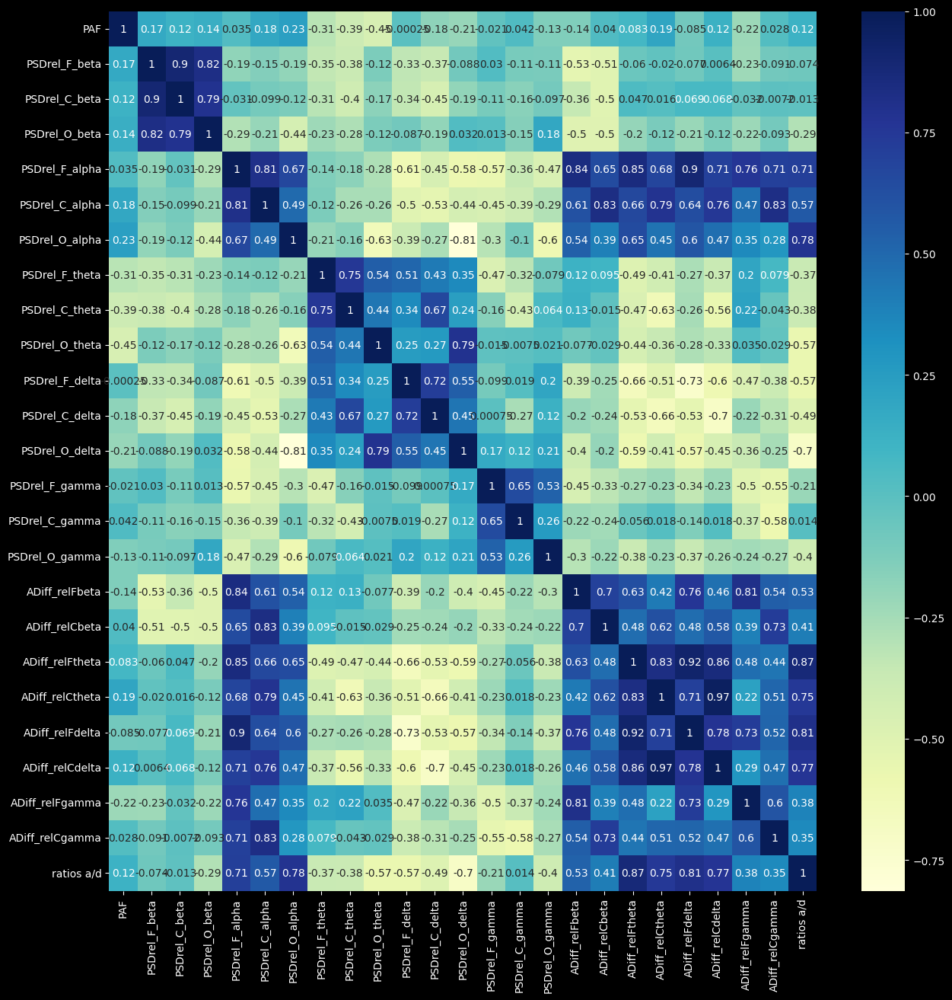

In [ ]:
corr = df[df.columns].corr(numeric_only = True)
plt.figure(figsize=(15,15))
sns.heatmap(corr, cmap="YlGnBu", annot=True);

### Normalización PSDs

Como estamos trabajando con números muy pequeños y porque tenemos algunos outliers presentes, vamos a transformar los datos a una distribución normal con media 0 y desviación 1:

In [ ]:
from sklearn.preprocessing import StandardScaler

cols = [col for col in df.columns if col not in ['ratios', 'subject', 'label', 'PAF']]
scaler = StandardScaler()

for col in cols:
  df[col] = scaler.fit_transform(df[[col]])

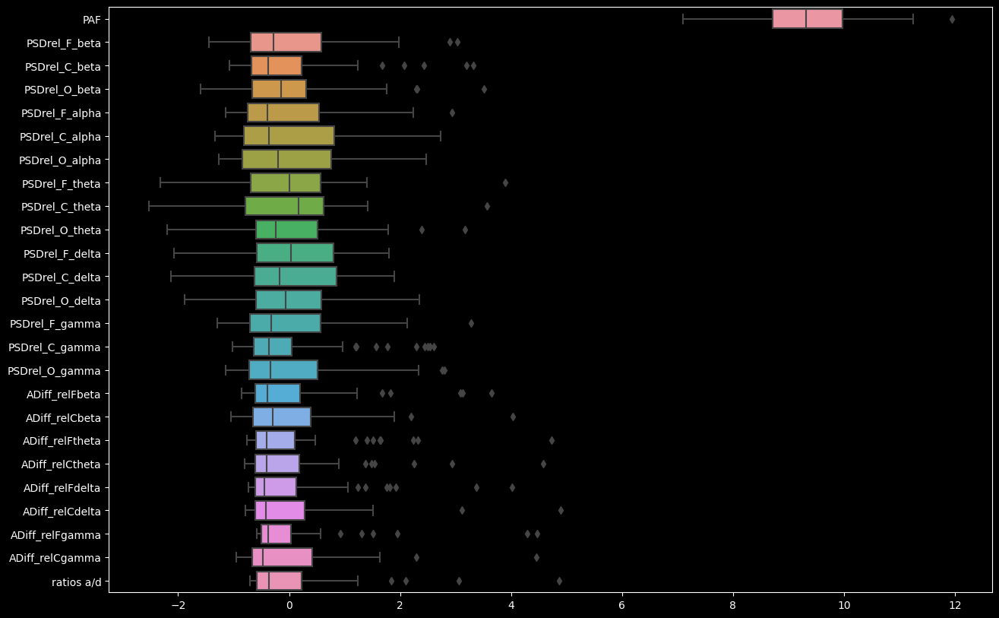

In [ ]:
plt.figure(figsize=(15,10))
sns.boxplot(data = df, orient = 'h');

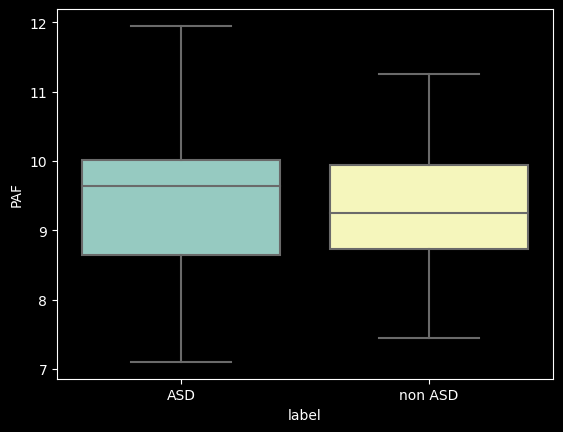

In [ ]:
sns.boxplot(x='label', y='PAF', data = df);

## Cross Validation

Probamos distintos modelos e hiperparametros a ver que nos daba mejor

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.linear_model import Perceptron
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

Dividimos los grupos en 2: uno de entrenamiento y otro de prueba. Utilizaremos estos dos grupos para entrenar y analizar con qué modelo obtenemos mejores resultados.

In [ ]:
X = df.drop(['label', 'subject' ], axis = 1)
y = df['label']

random_state = 42 # para asegurar reproducibilidad de los resultados
ts = 0.3 # test size, el estandar es 30% del

xtrain, xtest, ytrain, ytest = train_test_split(X, y, random_state=random_state, test_size=ts)
print('Training on '+str(ytrain.size)+' examples')

Training on 38 examples


Estos son todos los modelos que vamos a probar:

In [ ]:
model_lbls = ['dt', 'svc', 'knn', 'rf']

# Set the parameters by cross-validation
tuned_param_dt = [{'max_depth': [*range(1,20)]}]
tuned_param_svc = [{'kernel': ['rbf'],
                    'gamma': [1e-1, 1e-2, 1e-3, 1e-4, 1e-5, 1e-6],
                    'C': [1, 10, 100, 1000, 10000],
                    },
                    {'kernel': ['linear'],
                     'C': [1, 10, 100, 1000],
                    },
                   ]
tuned_param_knn =[{'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]}]
tuned_param_rf = [{'max_depth': [*range(5,15)],
                   'n_estimators':[*range(10,100,10)]}]

models = {
    'dt': {'name': 'Decision Tree',
           'estimator': DecisionTreeClassifier(),
           'param': tuned_param_dt,
          },
    'svc':{'name': 'Support Vector',
           'estimator': SVC(),
           'param': tuned_param_svc
          },
    'knn':{'name': 'K Nearest Neighbor',
           'estimator': KNeighborsClassifier(),
           'param': tuned_param_knn
       },
    'rf': {'name': 'Random forest',
           'estimator': RandomForestClassifier(),
           'param': tuned_param_rf
          }

}

scores = ['precision', 'recall']

def print_results(model):
    print("Best parameters set found on train set:")
    print()
    # if best is linear there is no gamma parameter
    print(model.best_params_)
    print()
    print("Grid scores on train set:")
    print()
    means = model.cv_results_['mean_test_score']
    stds = model.cv_results_['std_test_score']
    params = model.cv_results_['params']
    for mean, std, params_tuple in zip(means, stds, params):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std * 2, params_tuple))
    print()
    print("Detailed classification report for the best parameter set:")
    print()
    print("The model is trained on the full train set.")
    print("The scores are computed on the full test set.")
    print()
    y_true, y_pred = ytest, model.predict(xtest)
    print(classification_report(y_true, y_pred))
    print()

In [ ]:
best_scores = {}

for key in model_lbls:
  #models[key]['estimator'].fit(xtrain,ytrain)
  #predictions = models[key]['estimator'].predict(xtest)
  grid = GridSearchCV(estimator=models[key]['estimator'], param_grid=models[key]['param'], refit = scores)
  grid.fit(xtrain,ytrain)
  #grid_predictions = grid.predict(xtest)
  print('Trying model '+ models[key]['name'])
  print_results(grid)
  best_scores.update( {key : grid.best_score_} )

print('--------------')
print('Dictionary with best scores:')
print(best_scores)

Trying model Decision Tree
Best parameters set found on train set:

{'max_depth': 5}

Grid scores on train set:

0.471 (+/-0.250) for {'max_depth': 1}
0.496 (+/-0.231) for {'max_depth': 2}
0.525 (+/-0.135) for {'max_depth': 3}
0.496 (+/-0.266) for {'max_depth': 4}
0.629 (+/-0.316) for {'max_depth': 5}
0.468 (+/-0.272) for {'max_depth': 6}
0.493 (+/-0.301) for {'max_depth': 7}
0.571 (+/-0.347) for {'max_depth': 8}
0.493 (+/-0.340) for {'max_depth': 9}
0.525 (+/-0.261) for {'max_depth': 10}
0.629 (+/-0.273) for {'max_depth': 11}
0.550 (+/-0.270) for {'max_depth': 12}
0.464 (+/-0.379) for {'max_depth': 13}
0.550 (+/-0.270) for {'max_depth': 14}
0.543 (+/-0.365) for {'max_depth': 15}
0.493 (+/-0.340) for {'max_depth': 16}
0.493 (+/-0.301) for {'max_depth': 17}
0.496 (+/-0.266) for {'max_depth': 18}
0.514 (+/-0.498) for {'max_depth': 19}

Detailed classification report for the best parameter set:

The model is trained on the full train set.
The scores are computed on the full test set.

   

#Resultados

Una vez identificado el modelo con mayor score, vamos a analizar un poco más en profundidad cuales son los hiperparámetros que generan ese score y ver si podemos mejorarlos más:

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

svc = SVC(C = 100, gamma = 1e-3, kernel = 'rbf')
svc.fit(xtrain, ytrain)
y_pred_test = svc.predict(xtest)
acc = accuracy_score(ytest, y_pred_test)

print(f'The accuracy on testing set is {round(acc*100, 2)}%')

The accuracy on testing set is 70.59%


In [ ]:
print(classification_report(ytest, y_pred_test))

              precision    recall  f1-score   support

         ASD       0.70      0.78      0.74         9
     non ASD       0.71      0.62      0.67         8

    accuracy                           0.71        17
   macro avg       0.71      0.70      0.70        17
weighted avg       0.71      0.71      0.70        17



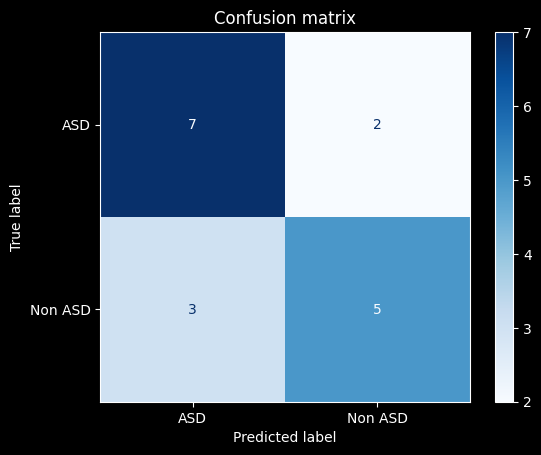

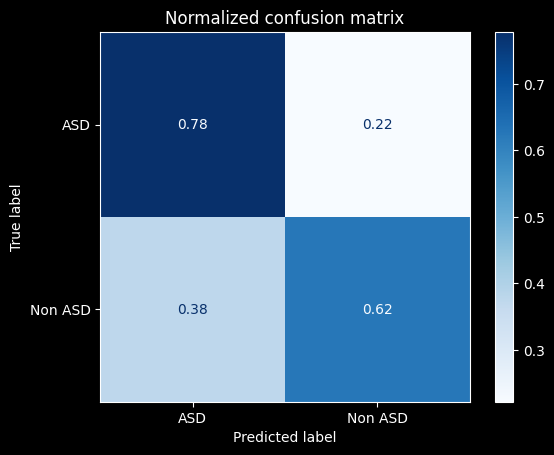

In [ ]:
titles = [('Confusion matrix', None), ('Normalized confusion matrix', 'true')]

for title, norm in titles:
  disp = ConfusionMatrixDisplay.from_estimator(svc, xtest, ytest,
                                              display_labels = ['ASD', 'Non ASD'],
                                              cmap = plt.cm.Blues,
                                              normalize = norm)
  disp.ax_.set_title(title)
  #print(disp.confusion_matrix)

plt.show()

#### Anexo sobre DT

Como nos pareció extraño que el score en el DT de tan bajo, intentamos utilizar menos features para ver si obteníamos mejores resultados:

In [ ]:
X = df[['PAF' , 'ratios a/d', 'ADiff_relFdelta', 'ADiff_relFtheta']]
y = df['label']

random_state = 42 # para asegurar reproducibilidad de los resultados
ts = 0.3 # test size, el estandar es 30% del

xtrain, xtest, ytrain, ytest = train_test_split(X, y, random_state=random_state, test_size=ts)
print('Training on '+str(ytrain.size)+' examples')

Training on 38 examples


In [ ]:
depths = range(1,10)
accs = []

for depth in depths:
  dt = DecisionTreeClassifier(max_depth = depth, random_state = 6)
  dt.fit(xtrain, ytrain)
  ytest_pred = dt.predict(xtest)
  acc = accuracy_score(ytest_pred, ytest)
  accs.append(acc)

accs

[0.6470588235294118,
 0.6470588235294118,
 0.7058823529411765,
 0.6470588235294118,
 0.7058823529411765,
 0.5882352941176471,
 0.5294117647058824,
 0.5294117647058824,
 0.5294117647058824]

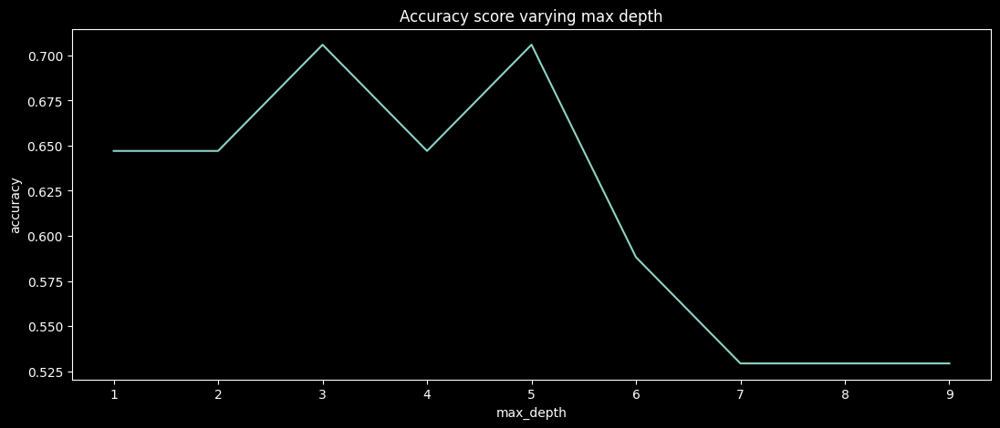

In [ ]:
plt.figure(figsize = (13, 5))
plt.plot(depths, accs)
plt.xlabel('max_depth')
plt.ylabel('accuracy')
plt.title('Accuracy score varying max depth')
plt.show()

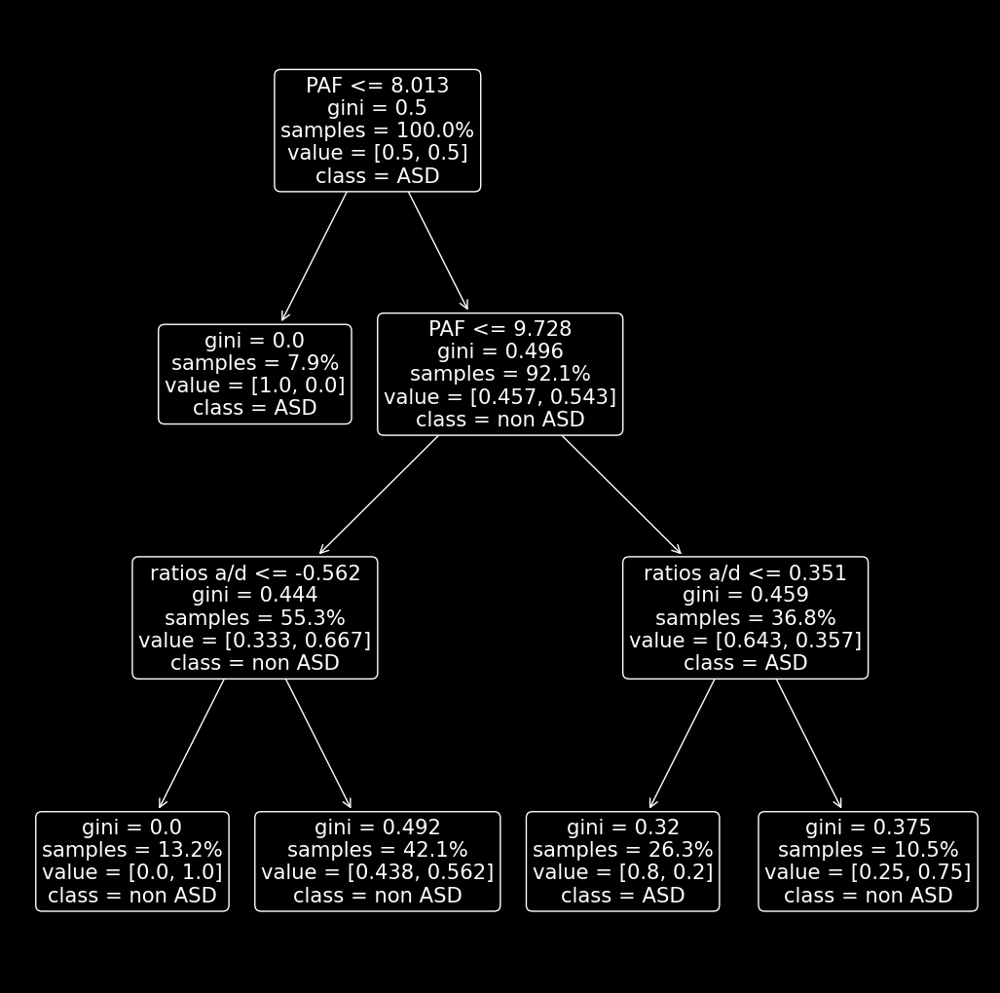

In [ ]:
from sklearn.tree import plot_tree

dt = DecisionTreeClassifier(max_depth = 3)
dt.fit(xtrain, ytrain)

plt.figure(figsize = (13,13))
plot_tree(dt, feature_names = X.columns, class_names = ['ASD', 'non ASD'], rounded = True, proportion = True);

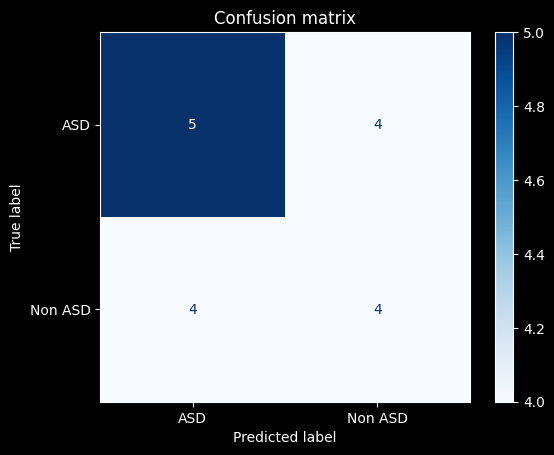

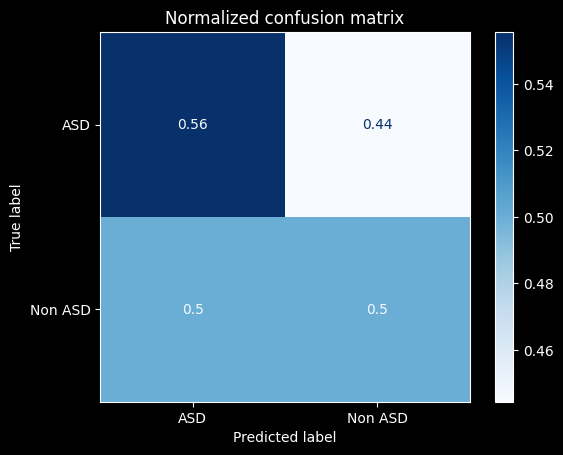

In [ ]:
titles = [('Confusion matrix', None), ('Normalized confusion matrix', 'true')]

for title, norm in titles:
  disp = ConfusionMatrixDisplay.from_estimator(dt, xtest, ytest,
                                              display_labels = ['ASD', 'Non ASD'],
                                              cmap = plt.cm.Blues,
                                              normalize = norm)
  disp.ax_.set_title(title)
  #print(disp.confusion_matrix)

plt.show()

# Conclusión
Desarrollamos un algoritmo que, a partir de determinadas características extraídas de la señal de un EEG, permite identificar si este corresponde a un paciente con Trastorno del Espectro Autista o no.

Las características utilizadas fueron:

* Variaciones en el pico de frecuencia alfa (PAF)
* Espectro de frecuencias relativo de cada banda (alpha, beta, gamma, delta, theta).
* Proporción relativa de la banda alpha respecto a las otras (U-shape)
* Proporción absoluta entre las bandas alpha y delta

Las variaciones que se observan de un EEG con ASD con respecto a otro sin ASD, son las que permiten la clasificación de los EEGs a partir del uso de distintas técnicas de *Machine Learning*.

En nuestro caso, utilizamos *Support Vector Machine*, *K-nearest neighbor* y *Random Forest*. Los resultados obtenidos con cada modelo son:

Modelo|Efectividad [%]
------|--------------
SVM   | 71
K-NN  | 65
RF    | 36
DT    | 41

Cabe destacar que para los resultados se tienen en consideración tanto la precisión como la sensibilidad, buscando que el modelo sea equilibrado. De esta manera, nos aseguramos que los valores reflejen resultados precisos, con la menor cantidad de falsos negativos y positivos.

Notamos que con SVM y K-NN cumplimos nuestro objetivo de mínima, que era encontrar una característica que permita identificar si un paciente presenta o no el trastorno con una efectividad de más del 60%. Sin embargo, no pudimos alcanzar el 90% del objetivo de máxima con ningún modelo, probando a su vez con distintas combinaciones de los parámetros.

Nuestro trabajo presenta algunas limitaciones que deben ser tenidas en consideración en caso de querer mejorar el algortimo desarrollado. En primer lugar, la cantidad de muestras utilizadas (n = 56) es muy baja. Deberíamos trabajar con más muestras, de forma tal que podamos tener tres grupos para analizar: uno de entrenamiento, otro de validación y otro de prueba.

Por otro lado, tampoco hicimos una distinción por edad en el momento de analizar los EEGs: si bien la media de edad era de 30 años, el rango de edad de los pacientes es muy amplia (18 - 67). Entonces, algunos cambios vinculados con las variaciones de PSD podrían estar relacionados con la edad del paciente y no con su diagnóstico. Esto podría verse reflejado, por ejemplo, en el hecho de que en SVM tenemos un alto porcentaje de falsos positivos (ver matriz de confusión: 38%).

En conclusión, consideramos que el algoritmo desarrollado es un buen primer acercamiento a la problemática planteada y su posible solución. Será necesario corregir los detalles mencionados y un análisis más exhaustivo de la relación entre las potencias de las bandas para, finalmente, alcanzar el objetivo de máxima.

#Bibliografía

*   Brihadiswaran, G., Haputhanthri, D., Gunathilaka, S., Meedeniya, D., &amp; Jayarathna, S. (2019). EEG-based processing and classification methodologies for autism spectrum disorder: A Review. Journal of Computer Science, 15(8), 1161–1183. https://doi.org/10.3844/jcssp.2019.1161.1183
*   Dickinson, A., Jeste, S., &amp; Milne, E. (2022). Electrophysiological signatures of brain aging in autism spectrum disorder. Cortex, 148, 139–151. https://doi.org/10.1016/j.cortex.2021.09.022
*   Rathee, S., Bhatia, D., Punia, V., & Singh, R. (2020). Peak Alpha Frequency in Relation to Cognitive Performance. Journal of neurosciences in rural practice, 11(3), 416–419. https://doi.org/10.1055/s-0040-1712585
*   Saba-Sadiya, S., Chantland, E., Alhanai, T., Liu, T., &amp; Ghassemi, M. M. (2021). Unsupervised EEG artifact detection and correction. Frontiers in Digital Health, 2. https://doi.org/10.3389/fdgth.2020.608920  
* Wang, J., Barstein, J., Ethridge, L. E., Mosconi, M. W., Takarae, Y., &amp; Sweeney, J. A. (2013). Resting state EEG abnormalities in autism spectrum disorders. Journal of Neurodevelopmental Disorders, 5(1). https://doi.org/10.1186/1866-1955-5-24
